# Session (475165_f7_stage2_day9)

# Processing of Raw Calcium Cortical Data into dFF tiff Stacks

In [1]:
"""install the packages to run this code"""
#%pip install matplotlib tifffile scipy tqdm pybaselines opencv-python imagecodecs pickle #plotly #need to do this through conda install

'install the packages to run this code'

In [2]:
session = "475165_f7_stage2_day9" #cageID_mouseID_stage_day

## Step 1: importing the proper libraries

note: all packaged are compatible with Python 3.12 as of 2024, Feb 22

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import tifffile
import cv2
from scipy import interpolate
from scipy.interpolate import interp1d
from scipy.ndimage import gaussian_filter
from scipy.signal import cheby1, filtfilt, find_peaks, peak_widths
import scipy
from tqdm import tqdm
%matplotlib inline
import plotly.express as px
import imagecodecs
from matplotlib.animation import FuncAnimation
import pickle
from pybaselines import Baseline
import pandas as pd
from ipywidgets import interact, FloatSlider
import matplotlib.gridspec as gridspec

from preprocessing_functions import (load_frames, 
                                        interactive_plot, 
                                        plot_frame, 
                                        temporal_mean, 
                                        remove_dark_frames, 
                                        extract_artifacts, 
                                        interpolate, 
                                        dff, 
                                        smoothing, 
                                        save_tiff,
                                        load_txt,
                                        extract_txt_flashes,
                                        load_masks, 
                                        avg_trials,
                                        extract_v1,
                                        animate_figure, 
extract_success,
sort_success,
extract_nogo)

## Step 2: importing and exporting from the script

### 2A: Manual importing data and paths

Please insert the file path for the tif stack as a 3d array

In [4]:
missing_artifacts = "FALSE"

In [5]:
cohort = "3_third_cohort"

### 2B: Manual Exporting data path

In [6]:
parts = session.split("_") # Split the string by underscores

cageID_mouseID = f"{parts[0]}_{parts[1]}" #cageID_mouseID
cageID, mouseID = parts[0], parts[1] #newv2
day = parts[3]  # what day of the stage they are in

print(f"cageID_mouseID = \"{cageID_mouseID}\"")
print(f"day = \"{day}\"")

cageID_mouseID = "475165_f7"
day = "day9"


### 2C: autonomous loadings and exporting lines !do not need to manipulate!

#### 2C.1: loading frames in

In [7]:
common_cortical_path = "X:/RaymondLab/1_Kai/1_cortical_data/"

In [8]:
video = f"{common_cortical_path}/{cohort}/stage2/{session}.tif"

In [9]:
frame_number = 6000 #please insert frame number to view
frames = load_frames(video); #loading in tif stack, this will take a little while

loading video, please wait...


dimensions are (30985, 128, 128) as a uint16


#### 2C.2: Tiff stack (spatial view videos) export

make sure folders exists: files are organized by common_tiff_path -> stage -> day -> full,single,double -> File_name(cage_mouseid_stage_day_condition)

In [10]:
common_tiff_path = "X:/RaymondLab/1_Kai/3_processed_data/1_tiff_stacks/stage2/"

In [11]:
tiff_path_full = f"{common_tiff_path}{day}/full_frame/{cageID_mouseID}_stage2_{day}_full_frame.tiff"
tiff_path_single = f"{common_tiff_path}{day}/single/{cageID_mouseID}_stage2_{day}_single.tiff"
tiff_path_double = f"{common_tiff_path}{day}/double/{cageID_mouseID}_stage2_{day}_double.tiff"

#### 2C.3: Pickle export timeseries array

make sure folders exist: files are organized by common_pickle_path -> stage -> day -> single,double -> ROI -> File_name(cage_mouseid_stage_day_condition)

In [12]:
common_pickle_path = "X:/RaymondLab/1_Kai/3_processed_data/2_pickle/stage2/"

In [13]:
pickle_single_v1 = f"{common_pickle_path}{day}/single/v1/{cageID_mouseID}_stage2_{day}_single_v1.pickle"
pickle_double_v1 = f"{common_pickle_path}{day}/double/v1/{cageID_mouseID}_stage2_{day}_double_v1.pickle"

pickle_single_success_ff = f"{common_pickle_path}single/success/full_frame/{cageID_mouseID}_stage2_{day}_single_success_ff.pickle"
pickle_double_success_ff = f"{common_pickle_path}double/success/full_frame/{cageID_mouseID}_stage2_{day}_double_success_ff.pickle"
pickle_nogo_success_ff = f"{common_pickle_path}nogo/success/full_frame/{cageID_mouseID}_stage2_{day}_nogo_success_ff.pickle"

pickle_single_fail_ff = f"{common_pickle_path}single/fail/full_frame/{cageID_mouseID}_stage2_{day}_single_fail_ff.pickle"
pickle_double_fail_ff = f"{common_pickle_path}double/fail/full_frame/{cageID_mouseID}_stage2_{day}_double_fail_ff.pickle"
pickle_nogo_fail_ff = f"{common_pickle_path}nogo/fail/full_frame/{cageID_mouseID}_stage2_{day}_nogo_fail_ff.pickle"

## Step 3: Plot of Raw Frames and Timecourse

### 3A: Plotting raw frame example, to make sure the tif stack loaded in properly.


Make sure the frames are a 3d array, two figures will be generated, a greyscaled and colormapped. They are technically identical

frame number 6000 plotted


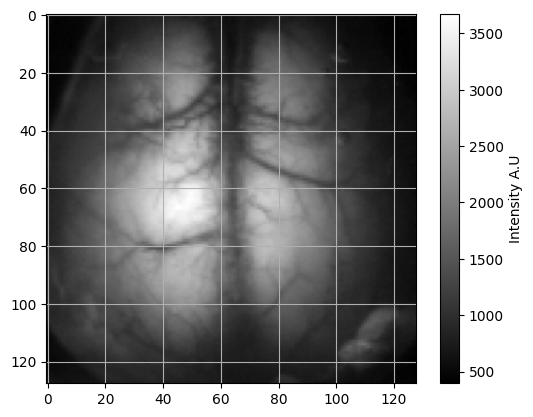

frame number 6000 plotted


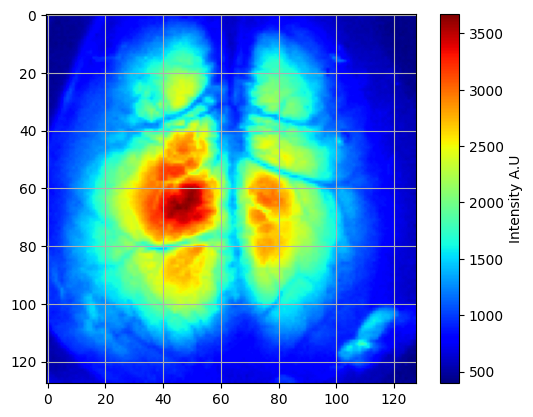

In [14]:
plot_frame(frames, frame_number, cmap = 'grey', color_label = "Intensity A.U")
plot_frame(frames, frame_number, cmap = 'jet', color_label = "Intensity A.U")

### 3B: Plot of the raw signal mean for each frame over the length of the experiment

Mean time course of the raw signal

In [15]:
mean_timecourse = temporal_mean(frames);

default 20% threshold is 433.141552734375 Determine if adjustments need to be made


## Step 4: Mean Timecourse without Darkframes at Start and End

#### 4A: plot of timecourse

#### 4B: number of single and double flashes as well as total number.

In [16]:
darkf_removed = remove_dark_frames(frames, mean_timecourse, 0.35)
darkf_removed_timecourse, darkf_removed_frames = darkf_removed[0], darkf_removed[1] #first one is the timecourse with no 3d, second is the 3d array

threshold determined to be: 487.28424682617185


#### 4C: pybaselines (only run if missing flashes)

In [17]:
if missing_artifacts == "TRUE":
    x = np.linspace(0, len(darkf_removed_timecourse), len(darkf_removed_timecourse))
    baseline_fitter = Baseline(x_data=x)

    smoothed_imodpoly = baseline_fitter.imodpoly(darkf_removed_timecourse, poly_order=3, num_std=0.7)[0]
    flattened = darkf_removed_timecourse-smoothed_imodpoly

    artifacts = extract_artifacts(flattened)
    artifact_indices, single_indices, double_indices = artifacts[0], artifacts[1], artifacts[2]

    #plotting moving mean and signal
    fig = px.line(y = [flattened])
    fig.update_layout(
    title= "mean timecourse with moving average overlay",
    xaxis=dict(title="frame number (30 fps)"),
    yaxis=dict(title="intensity value (A.U)"),
    xaxis_rangeslider_visible=True,
    showlegend=True)

    fig.for_each_trace(lambda t: t.update(name="Signal") if "0" in t.name else t.update(name="10s Moving Average"))

    fig.show()

    plt.figure()
    plt.plot(darkf_removed_timecourse, label='Subset Signal')
    plt.plot(smoothed_imodpoly, '--', label='Smoothed imodpoly')
    plt.legend()
    plt.show()

!! If the total does not match the single and double combined, check dataset!!

In [18]:
if missing_artifacts == "FALSE": #newv2
    artifacts = extract_artifacts(darkf_removed_timecourse)
    artifact_indices, single_indices, double_indices = artifacts[0], artifacts[1], artifacts[2]

Number of double_flash: 74
Number of double_flash pairs: 37
Number of single_flash: 30
Number of total flashes: 104


## Step 5: Artifact Removal and DFF

### 5A: Plot of mean timecourse with artifacts removed


plot is generated with interpolated frames where the artifacts were, approximately 5 frames

In [19]:
no_artifact_timecourse = interpolate(darkf_removed_frames, artifact_indices, 5)

interpolating artifact frames...


  0%|                                                                                          | 0/104 [00:00<?, ?it/s]

  1%|▊                                                                                 | 1/104 [00:01<02:08,  1.25s/it]

  2%|█▌                                                                                | 2/104 [00:02<02:15,  1.33s/it]

  3%|██▎                                                                               | 3/104 [00:03<02:11,  1.30s/it]

  4%|███▏                                                                              | 4/104 [00:05<02:14,  1.35s/it]

  5%|███▉                                                                              | 5/104 [00:06<02:10,  1.32s/it]

  6%|████▋                                                                             | 6/104 [00:07<02:10,  1.33s/it]

  7%|█████▌                                                                            | 7/104 [00:09<02:12,  1.37s/it]

  8%|██████▎                                                                           | 8/104 [00:10<02:11,  1.37s/it]

  9%|███████                                                                           | 9/104 [00:11<02:03,  1.30s/it]

 10%|███████▊                                                                         | 10/104 [00:13<02:06,  1.35s/it]

 11%|████████▌                                                                        | 11/104 [00:14<02:02,  1.32s/it]

 12%|█████████▎                                                                       | 12/104 [00:15<01:58,  1.29s/it]

 12%|██████████▏                                                                      | 13/104 [00:17<01:54,  1.26s/it]

 13%|██████████▉                                                                      | 14/104 [00:18<01:51,  1.24s/it]

 14%|███████████▋                                                                     | 15/104 [00:19<01:51,  1.26s/it]

 15%|████████████▍                                                                    | 16/104 [00:20<01:54,  1.30s/it]

 16%|█████████████▏                                                                   | 17/104 [00:22<01:51,  1.28s/it]

 17%|██████████████                                                                   | 18/104 [00:23<01:56,  1.35s/it]

 18%|██████████████▊                                                                  | 19/104 [00:24<01:52,  1.33s/it]

 19%|███████████████▌                                                                 | 20/104 [00:26<01:48,  1.29s/it]

 20%|████████████████▎                                                                | 21/104 [00:27<01:51,  1.34s/it]

 21%|█████████████████▏                                                               | 22/104 [00:29<01:51,  1.36s/it]

 22%|█████████████████▉                                                               | 23/104 [00:30<01:52,  1.39s/it]

 23%|██████████████████▋                                                              | 24/104 [00:31<01:49,  1.36s/it]

 24%|███████████████████▍                                                             | 25/104 [00:33<01:45,  1.34s/it]

 25%|████████████████████▎                                                            | 26/104 [00:34<01:42,  1.32s/it]

 26%|█████████████████████                                                            | 27/104 [00:35<01:39,  1.29s/it]

 27%|█████████████████████▊                                                           | 28/104 [00:36<01:35,  1.25s/it]

 28%|██████████████████████▌                                                          | 29/104 [00:37<01:33,  1.25s/it]

 29%|███████████████████████▎                                                         | 30/104 [00:39<01:34,  1.28s/it]

 30%|████████████████████████▏                                                        | 31/104 [00:40<01:31,  1.26s/it]

 31%|████████████████████████▉                                                        | 32/104 [00:41<01:30,  1.25s/it]

 32%|█████████████████████████▋                                                       | 33/104 [00:43<01:30,  1.27s/it]

 33%|██████████████████████████▍                                                      | 34/104 [00:44<01:28,  1.26s/it]

 34%|███████████████████████████▎                                                     | 35/104 [00:45<01:28,  1.29s/it]

 35%|████████████████████████████                                                     | 36/104 [00:46<01:26,  1.28s/it]

 36%|████████████████████████████▊                                                    | 37/104 [00:48<01:25,  1.28s/it]

 37%|█████████████████████████████▌                                                   | 38/104 [00:49<01:23,  1.26s/it]

 38%|██████████████████████████████▍                                                  | 39/104 [00:50<01:23,  1.28s/it]

 38%|███████████████████████████████▏                                                 | 40/104 [00:52<01:23,  1.30s/it]

 39%|███████████████████████████████▉                                                 | 41/104 [00:53<01:21,  1.29s/it]

 40%|████████████████████████████████▋                                                | 42/104 [00:54<01:21,  1.32s/it]

 41%|█████████████████████████████████▍                                               | 43/104 [00:56<01:20,  1.33s/it]

 42%|██████████████████████████████████▎                                              | 44/104 [00:57<01:18,  1.31s/it]

 43%|███████████████████████████████████                                              | 45/104 [00:58<01:17,  1.31s/it]

 44%|███████████████████████████████████▊                                             | 46/104 [01:00<01:18,  1.35s/it]

 45%|████████████████████████████████████▌                                            | 47/104 [01:01<01:15,  1.32s/it]

 46%|█████████████████████████████████████▍                                           | 48/104 [01:02<01:13,  1.31s/it]

 47%|██████████████████████████████████████▏                                          | 49/104 [01:03<01:12,  1.31s/it]

 48%|██████████████████████████████████████▉                                          | 50/104 [01:05<01:13,  1.36s/it]

 49%|███████████████████████████████████████▋                                         | 51/104 [01:06<01:12,  1.38s/it]

 50%|████████████████████████████████████████▌                                        | 52/104 [01:08<01:12,  1.39s/it]

 51%|█████████████████████████████████████████▎                                       | 53/104 [01:09<01:08,  1.34s/it]

 52%|██████████████████████████████████████████                                       | 54/104 [01:10<01:06,  1.34s/it]

 53%|██████████████████████████████████████████▊                                      | 55/104 [01:11<01:02,  1.28s/it]

 54%|███████████████████████████████████████████▌                                     | 56/104 [01:13<00:59,  1.25s/it]

 55%|████████████████████████████████████████████▍                                    | 57/104 [01:14<00:58,  1.24s/it]

 56%|█████████████████████████████████████████████▏                                   | 58/104 [01:15<00:57,  1.25s/it]

 57%|█████████████████████████████████████████████▉                                   | 59/104 [01:16<00:57,  1.28s/it]

 58%|██████████████████████████████████████████████▋                                  | 60/104 [01:18<00:57,  1.30s/it]

 59%|███████████████████████████████████████████████▌                                 | 61/104 [01:19<00:54,  1.26s/it]

 60%|████████████████████████████████████████████████▎                                | 62/104 [01:20<00:51,  1.23s/it]

 61%|█████████████████████████████████████████████████                                | 63/104 [01:22<00:52,  1.29s/it]

 62%|█████████████████████████████████████████████████▊                               | 64/104 [01:23<00:52,  1.32s/it]

 62%|██████████████████████████████████████████████████▋                              | 65/104 [01:24<00:51,  1.33s/it]

 63%|███████████████████████████████████████████████████▍                             | 66/104 [01:26<00:50,  1.32s/it]

 64%|████████████████████████████████████████████████████▏                            | 67/104 [01:27<00:48,  1.30s/it]

 65%|████████████████████████████████████████████████████▉                            | 68/104 [01:28<00:45,  1.28s/it]

 66%|█████████████████████████████████████████████████████▋                           | 69/104 [01:29<00:44,  1.26s/it]

 67%|██████████████████████████████████████████████████████▌                          | 70/104 [01:31<00:43,  1.28s/it]

 68%|███████████████████████████████████████████████████████▎                         | 71/104 [01:32<00:41,  1.26s/it]

 69%|████████████████████████████████████████████████████████                         | 72/104 [01:33<00:40,  1.26s/it]

 70%|████████████████████████████████████████████████████████▊                        | 73/104 [01:34<00:39,  1.27s/it]

 71%|█████████████████████████████████████████████████████████▋                       | 74/104 [01:36<00:39,  1.33s/it]

 72%|██████████████████████████████████████████████████████████▍                      | 75/104 [01:37<00:38,  1.33s/it]

 73%|███████████████████████████████████████████████████████████▏                     | 76/104 [01:38<00:36,  1.31s/it]

 74%|███████████████████████████████████████████████████████████▉                     | 77/104 [01:40<00:35,  1.32s/it]

 75%|████████████████████████████████████████████████████████████▊                    | 78/104 [01:41<00:33,  1.28s/it]

 76%|█████████████████████████████████████████████████████████████▌                   | 79/104 [01:42<00:32,  1.29s/it]

 77%|██████████████████████████████████████████████████████████████▎                  | 80/104 [01:44<00:31,  1.30s/it]

 78%|███████████████████████████████████████████████████████████████                  | 81/104 [01:45<00:29,  1.30s/it]

 79%|███████████████████████████████████████████████████████████████▊                 | 82/104 [01:46<00:28,  1.28s/it]

 80%|████████████████████████████████████████████████████████████████▋                | 83/104 [01:48<00:27,  1.30s/it]

 81%|█████████████████████████████████████████████████████████████████▍               | 84/104 [01:49<00:25,  1.28s/it]

 82%|██████████████████████████████████████████████████████████████████▏              | 85/104 [01:50<00:24,  1.27s/it]

 83%|██████████████████████████████████████████████████████████████████▉              | 86/104 [01:51<00:22,  1.28s/it]

 84%|███████████████████████████████████████████████████████████████████▊             | 87/104 [01:53<00:21,  1.29s/it]

 85%|████████████████████████████████████████████████████████████████████▌            | 88/104 [01:54<00:20,  1.28s/it]

 86%|█████████████████████████████████████████████████████████████████████▎           | 89/104 [01:55<00:19,  1.30s/it]

 87%|██████████████████████████████████████████████████████████████████████           | 90/104 [01:56<00:17,  1.27s/it]

 88%|██████████████████████████████████████████████████████████████████████▉          | 91/104 [01:58<00:16,  1.29s/it]

 88%|███████████████████████████████████████████████████████████████████████▋         | 92/104 [01:59<00:15,  1.29s/it]

 89%|████████████████████████████████████████████████████████████████████████▍        | 93/104 [02:00<00:13,  1.26s/it]

 90%|█████████████████████████████████████████████████████████████████████████▏       | 94/104 [02:01<00:12,  1.25s/it]

 91%|█████████████████████████████████████████████████████████████████████████▉       | 95/104 [02:03<00:11,  1.26s/it]

 92%|██████████████████████████████████████████████████████████████████████████▊      | 96/104 [02:04<00:10,  1.25s/it]

 93%|███████████████████████████████████████████████████████████████████████████▌     | 97/104 [02:05<00:08,  1.27s/it]

 94%|████████████████████████████████████████████████████████████████████████████▎    | 98/104 [02:07<00:07,  1.30s/it]

 95%|█████████████████████████████████████████████████████████████████████████████    | 99/104 [02:08<00:06,  1.28s/it]

 96%|████████████████████████████████████████████████████████████████████████████▉   | 100/104 [02:09<00:05,  1.31s/it]

 97%|█████████████████████████████████████████████████████████████████████████████▋  | 101/104 [02:11<00:03,  1.33s/it]

 98%|██████████████████████████████████████████████████████████████████████████████▍ | 102/104 [02:12<00:02,  1.36s/it]

 99%|███████████████████████████████████████████████████████████████████████████████▏| 103/104 [02:13<00:01,  1.31s/it]

100%|████████████████████████████████████████████████████████████████████████████████| 104/104 [02:14<00:00,  1.28s/it]

100%|████████████████████████████████████████████████████████████████████████████████| 104/104 [02:14<00:00,  1.30s/it]

### 5B: Calculating dff


Dff calculated from the 3d array without artifacts, darkframes removed, and interpolated the space where the artifacts were. Then plotting of the signal with the 10s moving mean before dff is applied. dff is applied using this moving mean onto the signal

In [20]:
dff_array = dff(no_artifact_timecourse, 10, 30);
dff_signal, moving_average = dff_array[0], dff_array[1]

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

 20%|████████████████▎                                                               | 26/128 [00:00<00:00, 252.52it/s]

 41%|████████████████████████████████▌                                               | 52/128 [00:00<00:00, 233.82it/s]

 61%|████████████████████████████████████████████████▊                               | 78/128 [00:00<00:00, 242.00it/s]

 80%|███████████████████████████████████████████████████████████████▌               | 103/128 [00:00<00:00, 238.74it/s]

 99%|██████████████████████████████████████████████████████████████████████████████▍| 127/128 [00:00<00:00, 229.71it/s]

100%|███████████████████████████████████████████████████████████████████████████████| 128/128 [00:00<00:00, 233.66it/s]

  0%|                                                                                        | 0/29862 [00:00<?, ?it/s]

  0%|                                                                              | 31/29862 [00:00<01:39, 301.07it/s]

  0%|▏                                                                             | 62/29862 [00:00<02:08, 231.12it/s]

  0%|▏                                                                             | 87/29862 [00:00<02:17, 216.73it/s]

  0%|▎                                                                            | 114/29862 [00:00<02:09, 229.17it/s]

  0%|▎                                                                            | 142/29862 [00:00<02:02, 242.27it/s]

  1%|▍                                                                            | 170/29862 [00:00<01:57, 251.64it/s]

  1%|▌                                                                            | 196/29862 [00:00<02:03, 239.62it/s]

  1%|▌                                                                            | 223/29862 [00:00<01:59, 247.76it/s]

  1%|▋                                                                            | 250/29862 [00:01<01:57, 252.09it/s]

  1%|▋                                                                            | 276/29862 [00:01<01:57, 251.48it/s]

  1%|▊                                                                            | 306/29862 [00:01<01:52, 262.64it/s]

  1%|▊                                                                            | 333/29862 [00:01<01:53, 259.51it/s]

  1%|▉                                                                            | 361/29862 [00:01<01:51, 263.96it/s]

  1%|█                                                                            | 390/29862 [00:01<01:49, 270.02it/s]

  1%|█                                                                            | 418/29862 [00:01<02:00, 244.96it/s]

  1%|█▏                                                                           | 446/29862 [00:01<01:56, 253.18it/s]

  2%|█▏                                                                           | 472/29862 [00:01<01:58, 248.64it/s]

  2%|█▎                                                                           | 498/29862 [00:01<01:57, 250.44it/s]

  2%|█▎                                                                           | 524/29862 [00:02<01:56, 251.05it/s]

  2%|█▍                                                                           | 550/29862 [00:02<01:57, 248.64it/s]

  2%|█▍                                                                           | 575/29862 [00:02<01:58, 246.23it/s]

  2%|█▌                                                                           | 602/29862 [00:02<01:55, 252.39it/s]

  2%|█▌                                                                           | 628/29862 [00:02<02:01, 239.96it/s]

  2%|█▋                                                                           | 653/29862 [00:02<02:03, 236.16it/s]

  2%|█▋                                                                           | 677/29862 [00:02<02:10, 223.44it/s]

  2%|█▊                                                                           | 700/29862 [00:02<02:15, 214.66it/s]

  2%|█▊                                                                           | 723/29862 [00:02<02:13, 217.67it/s]

  3%|█▉                                                                           | 751/29862 [00:03<02:04, 233.77it/s]

  3%|██                                                                           | 778/29862 [00:03<01:59, 242.70it/s]

  3%|██                                                                           | 807/29862 [00:03<01:53, 255.58it/s]

  3%|██▏                                                                          | 833/29862 [00:03<01:58, 245.48it/s]

  3%|██▏                                                                          | 860/29862 [00:03<01:55, 251.76it/s]

  3%|██▎                                                                          | 886/29862 [00:03<01:54, 252.70it/s]

  3%|██▎                                                                          | 912/29862 [00:03<01:55, 249.77it/s]

  3%|██▍                                                                          | 938/29862 [00:03<02:00, 239.60it/s]

  3%|██▍                                                                          | 966/29862 [00:03<01:55, 250.29it/s]

  3%|██▌                                                                          | 994/29862 [00:04<01:52, 255.89it/s]

  3%|██▌                                                                         | 1021/29862 [00:04<01:52, 257.02it/s]

  4%|██▋                                                                         | 1048/29862 [00:04<01:50, 260.04it/s]

  4%|██▋                                                                         | 1075/29862 [00:04<01:57, 245.78it/s]

  4%|██▊                                                                         | 1103/29862 [00:04<01:53, 253.26it/s]

  4%|██▊                                                                         | 1129/29862 [00:04<01:54, 250.23it/s]

  4%|██▉                                                                         | 1155/29862 [00:04<01:54, 250.19it/s]

  4%|███                                                                         | 1182/29862 [00:04<01:52, 255.57it/s]

  4%|███                                                                         | 1209/29862 [00:04<01:50, 259.26it/s]

  4%|███▏                                                                        | 1237/29862 [00:04<01:48, 263.82it/s]

  4%|███▏                                                                        | 1264/29862 [00:05<01:48, 262.58it/s]

  4%|███▎                                                                        | 1291/29862 [00:05<01:50, 258.71it/s]

  4%|███▎                                                                        | 1320/29862 [00:05<01:46, 267.05it/s]

  5%|███▍                                                                        | 1347/29862 [00:05<01:47, 266.38it/s]

  5%|███▍                                                                        | 1374/29862 [00:05<01:49, 260.59it/s]

  5%|███▌                                                                        | 1401/29862 [00:05<01:49, 261.07it/s]

  5%|███▋                                                                        | 1428/29862 [00:05<01:57, 241.87it/s]

  5%|███▋                                                                        | 1453/29862 [00:05<01:57, 242.13it/s]

  5%|███▊                                                                        | 1478/29862 [00:05<01:59, 238.34it/s]

  5%|███▊                                                                        | 1503/29862 [00:06<01:59, 236.98it/s]

  5%|███▉                                                                        | 1528/29862 [00:06<02:00, 235.36it/s]

  5%|███▉                                                                        | 1557/29862 [00:06<01:53, 249.45it/s]

  5%|████                                                                        | 1583/29862 [00:06<01:53, 248.23it/s]

  5%|████                                                                        | 1608/29862 [00:06<01:56, 241.82it/s]

  5%|████▏                                                                       | 1633/29862 [00:06<01:58, 238.07it/s]

  6%|████▏                                                                       | 1662/29862 [00:06<01:51, 252.14it/s]

  6%|████▎                                                                       | 1691/29862 [00:06<01:48, 260.83it/s]

  6%|████▍                                                                       | 1720/29862 [00:06<01:44, 268.53it/s]

  6%|████▍                                                                       | 1748/29862 [00:06<01:43, 270.33it/s]

  6%|████▌                                                                       | 1776/29862 [00:07<01:48, 258.78it/s]

  6%|████▌                                                                       | 1803/29862 [00:07<01:55, 243.97it/s]

  6%|████▋                                                                       | 1828/29862 [00:07<01:54, 244.98it/s]

  6%|████▋                                                                       | 1856/29862 [00:07<01:50, 252.71it/s]

  6%|████▊                                                                       | 1883/29862 [00:07<01:49, 256.20it/s]

  6%|████▊                                                                       | 1909/29862 [00:07<01:48, 256.59it/s]

  6%|████▉                                                                       | 1935/29862 [00:07<01:55, 241.01it/s]

  7%|████▉                                                                       | 1962/29862 [00:07<01:52, 247.63it/s]

  7%|█████                                                                       | 1988/29862 [00:07<01:51, 249.35it/s]

  7%|█████▏                                                                      | 2014/29862 [00:08<01:51, 249.45it/s]

  7%|█████▏                                                                      | 2042/29862 [00:08<01:48, 256.81it/s]

  7%|█████▎                                                                      | 2068/29862 [00:08<01:50, 250.48it/s]

  7%|█████▎                                                                      | 2094/29862 [00:08<01:51, 248.25it/s]

  7%|█████▍                                                                      | 2123/29862 [00:08<01:46, 259.52it/s]

  7%|█████▍                                                                      | 2150/29862 [00:08<01:46, 260.32it/s]

  7%|█████▌                                                                      | 2177/29862 [00:08<01:45, 262.41it/s]

  7%|█████▌                                                                      | 2206/29862 [00:08<01:42, 268.95it/s]

  7%|█████▋                                                                      | 2234/29862 [00:08<01:42, 270.64it/s]

  8%|█████▊                                                                      | 2263/29862 [00:09<01:40, 275.56it/s]

  8%|█████▊                                                                      | 2292/29862 [00:09<01:38, 279.03it/s]

  8%|█████▉                                                                      | 2321/29862 [00:09<01:37, 281.48it/s]

  8%|█████▉                                                                      | 2350/29862 [00:09<01:47, 256.62it/s]

  8%|██████                                                                      | 2377/29862 [00:09<01:45, 259.63it/s]

  8%|██████                                                                      | 2404/29862 [00:09<01:47, 254.67it/s]

  8%|██████▏                                                                     | 2430/29862 [00:09<01:47, 254.05it/s]

  8%|██████▎                                                                     | 2456/29862 [00:09<01:51, 245.28it/s]

  8%|██████▎                                                                     | 2485/29862 [00:09<01:46, 256.43it/s]

  8%|██████▍                                                                     | 2511/29862 [00:10<01:54, 239.70it/s]

  8%|██████▍                                                                     | 2536/29862 [00:10<01:53, 241.23it/s]

  9%|██████▌                                                                     | 2565/29862 [00:10<01:47, 254.25it/s]

  9%|██████▌                                                                     | 2591/29862 [00:10<01:48, 252.31it/s]

  9%|██████▋                                                                     | 2617/29862 [00:10<01:49, 249.53it/s]

  9%|██████▋                                                                     | 2643/29862 [00:10<01:50, 246.21it/s]

  9%|██████▊                                                                     | 2668/29862 [00:10<01:53, 240.45it/s]

  9%|██████▊                                                                     | 2695/29862 [00:10<01:50, 245.44it/s]

  9%|██████▉                                                                     | 2721/29862 [00:10<01:50, 245.67it/s]

  9%|██████▉                                                                     | 2746/29862 [00:10<01:50, 245.15it/s]

  9%|███████                                                                     | 2774/29862 [00:11<01:47, 252.66it/s]

  9%|███████▏                                                                    | 2801/29862 [00:11<01:45, 255.49it/s]

  9%|███████▏                                                                    | 2827/29862 [00:11<01:45, 256.40it/s]

 10%|███████▎                                                                    | 2853/29862 [00:11<01:53, 238.58it/s]

 10%|███████▎                                                                    | 2881/29862 [00:11<01:49, 247.43it/s]

 10%|███████▍                                                                    | 2908/29862 [00:11<01:47, 251.71it/s]

 10%|███████▍                                                                    | 2935/29862 [00:11<01:45, 254.06it/s]

 10%|███████▌                                                                    | 2961/29862 [00:11<01:48, 248.64it/s]

 10%|███████▌                                                                    | 2988/29862 [00:11<01:45, 254.04it/s]

 10%|███████▋                                                                    | 3014/29862 [00:12<01:48, 247.21it/s]

 10%|███████▋                                                                    | 3039/29862 [00:12<01:48, 247.33it/s]

 10%|███████▊                                                                    | 3068/29862 [00:12<01:44, 257.46it/s]

 10%|███████▊                                                                    | 3094/29862 [00:12<01:45, 253.08it/s]

 10%|███████▉                                                                    | 3120/29862 [00:12<01:50, 241.82it/s]

 11%|████████                                                                    | 3147/29862 [00:12<01:48, 245.63it/s]

 11%|████████                                                                    | 3172/29862 [00:12<01:50, 242.09it/s]

 11%|████████▏                                                                   | 3197/29862 [00:12<01:50, 240.27it/s]

 11%|████████▏                                                                   | 3224/29862 [00:12<01:47, 247.37it/s]

 11%|████████▎                                                                   | 3249/29862 [00:12<01:50, 239.85it/s]

 11%|████████▎                                                                   | 3276/29862 [00:13<01:47, 247.06it/s]

 11%|████████▍                                                                   | 3302/29862 [00:13<01:46, 249.37it/s]

 11%|████████▍                                                                   | 3331/29862 [00:13<01:41, 260.44it/s]

 11%|████████▌                                                                   | 3358/29862 [00:13<01:51, 238.18it/s]

 11%|████████▌                                                                   | 3383/29862 [00:13<01:53, 233.13it/s]

 11%|████████▋                                                                   | 3407/29862 [00:13<01:55, 229.37it/s]

 11%|████████▋                                                                   | 3431/29862 [00:13<01:55, 229.30it/s]

 12%|████████▊                                                                   | 3455/29862 [00:13<01:59, 220.56it/s]

 12%|████████▊                                                                   | 3482/29862 [00:13<01:52, 233.58it/s]

 12%|████████▉                                                                   | 3508/29862 [00:14<01:49, 239.98it/s]

 12%|████████▉                                                                   | 3533/29862 [00:14<01:51, 236.78it/s]

 12%|█████████                                                                   | 3557/29862 [00:14<01:51, 236.37it/s]

 12%|█████████▏                                                                  | 3586/29862 [00:14<01:45, 248.99it/s]

 12%|█████████▏                                                                  | 3611/29862 [00:14<01:50, 238.28it/s]

 12%|█████████▎                                                                  | 3636/29862 [00:14<01:49, 240.26it/s]

 12%|█████████▎                                                                  | 3662/29862 [00:14<01:47, 243.16it/s]

 12%|█████████▍                                                                  | 3687/29862 [00:14<01:47, 243.75it/s]

 12%|█████████▍                                                                  | 3717/29862 [00:14<01:41, 257.88it/s]

 13%|█████████▌                                                                  | 3746/29862 [00:15<01:37, 266.49it/s]

 13%|█████████▌                                                                  | 3773/29862 [00:15<01:40, 260.67it/s]

 13%|█████████▋                                                                  | 3800/29862 [00:15<01:44, 248.28it/s]

 13%|█████████▋                                                                  | 3825/29862 [00:15<01:49, 238.73it/s]

 13%|█████████▊                                                                  | 3854/29862 [00:15<01:43, 250.92it/s]

 13%|█████████▊                                                                  | 3880/29862 [00:15<01:44, 248.59it/s]

 13%|█████████▉                                                                  | 3905/29862 [00:15<01:48, 238.86it/s]

 13%|██████████                                                                  | 3930/29862 [00:15<01:56, 222.11it/s]

 13%|██████████                                                                  | 3955/29862 [00:15<01:53, 228.40it/s]

 13%|██████████▏                                                                 | 3985/29862 [00:16<01:45, 246.15it/s]

 13%|██████████▏                                                                 | 4014/29862 [00:16<01:40, 257.07it/s]

 14%|██████████▎                                                                 | 4041/29862 [00:16<01:39, 260.04it/s]

 14%|██████████▎                                                                 | 4068/29862 [00:16<01:40, 255.56it/s]

 14%|██████████▍                                                                 | 4094/29862 [00:16<01:40, 255.40it/s]

 14%|██████████▍                                                                 | 4120/29862 [00:16<01:46, 240.74it/s]

 14%|██████████▌                                                                 | 4148/29862 [00:16<01:42, 250.33it/s]

 14%|██████████▋                                                                 | 4178/29862 [00:16<01:38, 261.61it/s]

 14%|██████████▋                                                                 | 4205/29862 [00:16<01:41, 252.33it/s]

 14%|██████████▊                                                                 | 4231/29862 [00:16<01:43, 247.55it/s]

 14%|██████████▊                                                                 | 4260/29862 [00:17<01:39, 257.96it/s]

 14%|██████████▉                                                                 | 4286/29862 [00:17<01:39, 257.10it/s]

 14%|██████████▉                                                                 | 4315/29862 [00:17<01:36, 265.85it/s]

 15%|███████████                                                                 | 4342/29862 [00:17<01:37, 262.50it/s]

 15%|███████████▏                                                                | 4372/29862 [00:17<01:34, 270.28it/s]

 15%|███████████▏                                                                | 4401/29862 [00:17<01:32, 275.24it/s]

 15%|███████████▎                                                                | 4429/29862 [00:17<01:32, 275.85it/s]

 15%|███████████▎                                                                | 4457/29862 [00:17<01:34, 267.65it/s]

 15%|███████████▍                                                                | 4484/29862 [00:17<01:36, 263.04it/s]

 15%|███████████▍                                                                | 4511/29862 [00:18<01:38, 256.22it/s]

 15%|███████████▌                                                                | 4538/29862 [00:18<01:38, 257.96it/s]

 15%|███████████▌                                                                | 4565/29862 [00:18<01:37, 260.70it/s]

 15%|███████████▋                                                                | 4592/29862 [00:18<01:37, 259.66it/s]

 15%|███████████▊                                                                | 4618/29862 [00:18<01:40, 251.04it/s]

 16%|███████████▊                                                                | 4645/29862 [00:18<01:38, 255.03it/s]

 16%|███████████▉                                                                | 4672/29862 [00:18<01:37, 258.64it/s]

 16%|███████████▉                                                                | 4699/29862 [00:18<01:36, 259.71it/s]

 16%|████████████                                                                | 4726/29862 [00:18<01:35, 261.98it/s]

 16%|████████████                                                                | 4753/29862 [00:18<01:36, 259.78it/s]

 16%|████████████▏                                                               | 4780/29862 [00:19<01:38, 254.61it/s]

 16%|████████████▏                                                               | 4809/29862 [00:19<01:34, 264.07it/s]

 16%|████████████▎                                                               | 4838/29862 [00:19<01:32, 270.07it/s]

 16%|████████████▍                                                               | 4868/29862 [00:19<01:30, 275.63it/s]

 16%|████████████▍                                                               | 4896/29862 [00:19<01:35, 260.93it/s]

 16%|████████████▌                                                               | 4923/29862 [00:19<01:37, 255.58it/s]

 17%|████████████▌                                                               | 4950/29862 [00:19<01:36, 259.42it/s]

 17%|████████████▋                                                               | 4977/29862 [00:19<01:34, 262.17it/s]

 17%|████████████▋                                                               | 5004/29862 [00:19<01:44, 236.97it/s]

 17%|████████████▊                                                               | 5029/29862 [00:20<01:47, 231.14it/s]

 17%|████████████▊                                                               | 5057/29862 [00:20<01:42, 242.43it/s]

 17%|████████████▉                                                               | 5082/29862 [00:20<01:42, 241.87it/s]

 17%|█████████████                                                               | 5111/29862 [00:20<01:37, 254.74it/s]

 17%|█████████████                                                               | 5137/29862 [00:20<01:37, 253.37it/s]

 17%|█████████████▏                                                              | 5163/29862 [00:20<01:51, 220.95it/s]

 17%|█████████████▏                                                              | 5190/29862 [00:20<01:46, 231.42it/s]

 17%|█████████████▎                                                              | 5214/29862 [00:20<01:51, 221.19it/s]

 18%|█████████████▎                                                              | 5242/29862 [00:20<01:44, 235.08it/s]

 18%|█████████████▍                                                              | 5267/29862 [00:21<01:46, 230.95it/s]

 18%|█████████████▍                                                              | 5291/29862 [00:21<01:49, 224.81it/s]

 18%|█████████████▌                                                              | 5317/29862 [00:21<01:45, 231.95it/s]

 18%|█████████████▌                                                              | 5343/29862 [00:21<01:43, 237.16it/s]

 18%|█████████████▋                                                              | 5368/29862 [00:21<01:42, 238.79it/s]

 18%|█████████████▋                                                              | 5395/29862 [00:21<01:39, 244.95it/s]

 18%|█████████████▊                                                              | 5424/29862 [00:21<01:35, 257.21it/s]

 18%|█████████████▊                                                              | 5450/29862 [00:21<01:43, 236.08it/s]

 18%|█████████████▉                                                              | 5477/29862 [00:21<01:39, 244.77it/s]

 18%|██████████████                                                              | 5505/29862 [00:22<01:37, 250.49it/s]

 19%|██████████████                                                              | 5533/29862 [00:22<01:34, 256.70it/s]

 19%|██████████████▏                                                             | 5559/29862 [00:22<01:35, 253.32it/s]

 19%|██████████████▏                                                             | 5585/29862 [00:22<01:36, 252.37it/s]

 19%|██████████████▎                                                             | 5611/29862 [00:22<01:36, 250.97it/s]

 19%|██████████████▎                                                             | 5639/29862 [00:22<01:34, 256.42it/s]

 19%|██████████████▍                                                             | 5665/29862 [00:22<01:35, 253.09it/s]

 19%|██████████████▍                                                             | 5693/29862 [00:22<01:33, 258.76it/s]

 19%|██████████████▌                                                             | 5719/29862 [00:22<01:34, 255.31it/s]

 19%|██████████████▌                                                             | 5745/29862 [00:22<01:35, 252.93it/s]

 19%|██████████████▋                                                             | 5771/29862 [00:23<01:35, 252.75it/s]

 19%|██████████████▊                                                             | 5798/29862 [00:23<01:33, 256.34it/s]

 20%|██████████████▊                                                             | 5826/29862 [00:23<01:31, 261.76it/s]

 20%|██████████████▉                                                             | 5853/29862 [00:23<01:44, 229.80it/s]

 20%|██████████████▉                                                             | 5880/29862 [00:23<01:39, 239.93it/s]

 20%|███████████████                                                             | 5907/29862 [00:23<01:37, 246.89it/s]

 20%|███████████████                                                             | 5936/29862 [00:23<01:33, 256.17it/s]

 20%|███████████████▏                                                            | 5962/29862 [00:23<01:33, 255.83it/s]

 20%|███████████████▏                                                            | 5988/29862 [00:23<01:41, 235.38it/s]

 20%|███████████████▎                                                            | 6013/29862 [00:24<01:40, 237.45it/s]

 20%|███████████████▎                                                            | 6039/29862 [00:24<01:38, 242.42it/s]

 20%|███████████████▍                                                            | 6068/29862 [00:24<01:33, 255.24it/s]

 20%|███████████████▌                                                            | 6096/29862 [00:24<01:30, 261.65it/s]

 21%|███████████████▌                                                            | 6124/29862 [00:24<01:29, 264.71it/s]

 21%|███████████████▋                                                            | 6151/29862 [00:24<01:38, 240.33it/s]

 21%|███████████████▋                                                            | 6178/29862 [00:24<01:35, 247.12it/s]

 21%|███████████████▊                                                            | 6204/29862 [00:24<01:40, 236.21it/s]

 21%|███████████████▊                                                            | 6233/29862 [00:24<01:34, 250.26it/s]

 21%|███████████████▉                                                            | 6259/29862 [00:25<01:35, 247.47it/s]

 21%|███████████████▉                                                            | 6285/29862 [00:25<01:36, 244.15it/s]

 21%|████████████████                                                            | 6313/29862 [00:25<01:32, 253.54it/s]

 21%|████████████████▏                                                           | 6339/29862 [00:25<01:35, 245.58it/s]

 21%|████████████████▏                                                           | 6368/29862 [00:25<01:31, 257.41it/s]

 21%|████████████████▎                                                           | 6394/29862 [00:25<01:32, 254.53it/s]

 21%|████████████████▎                                                           | 6420/29862 [00:25<01:38, 237.38it/s]

 22%|████████████████▍                                                           | 6446/29862 [00:25<01:36, 241.91it/s]

 22%|████████████████▍                                                           | 6471/29862 [00:25<01:35, 244.05it/s]

 22%|████████████████▌                                                           | 6500/29862 [00:26<01:31, 255.36it/s]

 22%|████████████████▌                                                           | 6526/29862 [00:26<01:31, 255.25it/s]

 22%|████████████████▋                                                           | 6555/29862 [00:26<01:27, 265.31it/s]

 22%|████████████████▊                                                           | 6583/29862 [00:26<01:26, 268.10it/s]

 22%|████████████████▊                                                           | 6612/29862 [00:26<01:24, 273.77it/s]

 22%|████████████████▉                                                           | 6640/29862 [00:26<01:30, 255.28it/s]

 22%|████████████████▉                                                           | 6668/29862 [00:26<01:29, 260.06it/s]

 22%|█████████████████                                                           | 6696/29862 [00:26<01:27, 264.26it/s]

 23%|█████████████████                                                           | 6723/29862 [00:26<01:31, 252.15it/s]

 23%|█████████████████▏                                                          | 6749/29862 [00:26<01:31, 253.66it/s]

 23%|█████████████████▏                                                          | 6776/29862 [00:27<01:29, 257.62it/s]

 23%|█████████████████▎                                                          | 6802/29862 [00:27<01:31, 252.49it/s]

 23%|█████████████████▍                                                          | 6830/29862 [00:27<01:29, 257.47it/s]

 23%|█████████████████▍                                                          | 6856/29862 [00:27<01:40, 229.70it/s]

 23%|█████████████████▌                                                          | 6880/29862 [00:27<01:39, 231.86it/s]

 23%|█████████████████▌                                                          | 6904/29862 [00:27<01:39, 231.58it/s]

 23%|█████████████████▋                                                          | 6928/29862 [00:27<01:41, 226.33it/s]

 23%|█████████████████▋                                                          | 6951/29862 [00:27<01:41, 226.12it/s]

 23%|█████████████████▊                                                          | 6979/29862 [00:27<01:35, 240.78it/s]

 23%|█████████████████▊                                                          | 7006/29862 [00:28<01:32, 247.10it/s]

 24%|█████████████████▉                                                          | 7035/29862 [00:28<01:28, 258.82it/s]

 24%|█████████████████▉                                                          | 7064/29862 [00:28<01:25, 267.18it/s]

 24%|██████████████████                                                          | 7092/29862 [00:28<01:24, 270.18it/s]

 24%|██████████████████                                                          | 7120/29862 [00:28<01:30, 250.90it/s]

 24%|██████████████████▏                                                         | 7146/29862 [00:28<01:34, 241.33it/s]

 24%|██████████████████▎                                                         | 7171/29862 [00:28<01:35, 238.40it/s]

 24%|██████████████████▎                                                         | 7199/29862 [00:28<01:31, 248.58it/s]

 24%|██████████████████▍                                                         | 7228/29862 [00:28<01:27, 257.41it/s]

 24%|██████████████████▍                                                         | 7256/29862 [00:29<01:26, 260.92it/s]

 24%|██████████████████▌                                                         | 7283/29862 [00:29<01:27, 258.36it/s]

 24%|██████████████████▌                                                         | 7309/29862 [00:29<01:27, 257.38it/s]

 25%|██████████████████▋                                                         | 7335/29862 [00:29<01:29, 250.90it/s]

 25%|██████████████████▋                                                         | 7364/29862 [00:29<01:26, 261.39it/s]

 25%|██████████████████▊                                                         | 7391/29862 [00:29<01:27, 257.20it/s]

 25%|██████████████████▉                                                         | 7420/29862 [00:29<01:24, 265.90it/s]

 25%|██████████████████▉                                                         | 7449/29862 [00:29<01:22, 272.14it/s]

 25%|███████████████████                                                         | 7477/29862 [00:29<01:27, 257.16it/s]

 25%|███████████████████                                                         | 7504/29862 [00:29<01:26, 259.34it/s]

 25%|███████████████████▏                                                        | 7531/29862 [00:30<01:29, 249.58it/s]

 25%|███████████████████▏                                                        | 7557/29862 [00:30<01:36, 230.01it/s]

 25%|███████████████████▎                                                        | 7582/29862 [00:30<01:35, 234.12it/s]

 25%|███████████████████▎                                                        | 7606/29862 [00:30<01:38, 225.23it/s]

 26%|███████████████████▍                                                        | 7633/29862 [00:30<01:34, 235.54it/s]

 26%|███████████████████▍                                                        | 7660/29862 [00:30<01:30, 244.49it/s]

 26%|███████████████████▌                                                        | 7685/29862 [00:30<01:37, 227.94it/s]

 26%|███████████████████▋                                                        | 7714/29862 [00:30<01:30, 244.26it/s]

 26%|███████████████████▋                                                        | 7739/29862 [00:31<01:40, 221.11it/s]

 26%|███████████████████▊                                                        | 7762/29862 [00:31<01:39, 222.89it/s]

 26%|███████████████████▊                                                        | 7785/29862 [00:31<01:40, 219.45it/s]

 26%|███████████████████▉                                                        | 7811/29862 [00:31<01:36, 228.79it/s]

 26%|███████████████████▉                                                        | 7835/29862 [00:31<01:35, 231.31it/s]

 26%|████████████████████                                                        | 7863/29862 [00:31<01:29, 244.57it/s]

 26%|████████████████████                                                        | 7891/29862 [00:31<01:26, 253.39it/s]

 27%|████████████████████▏                                                       | 7917/29862 [00:31<01:27, 249.93it/s]

 27%|████████████████████▏                                                       | 7946/29862 [00:31<01:24, 259.52it/s]

 27%|████████████████████▎                                                       | 7973/29862 [00:31<01:25, 255.90it/s]

 27%|████████████████████▎                                                       | 7999/29862 [00:32<01:25, 254.24it/s]

 27%|████████████████████▍                                                       | 8025/29862 [00:32<01:28, 245.62it/s]

 27%|████████████████████▍                                                       | 8051/29862 [00:32<01:27, 248.32it/s]

 27%|████████████████████▌                                                       | 8080/29862 [00:32<01:23, 259.59it/s]

 27%|████████████████████▋                                                       | 8107/29862 [00:32<01:26, 252.34it/s]

 27%|████████████████████▋                                                       | 8133/29862 [00:32<01:29, 244.14it/s]

 27%|████████████████████▊                                                       | 8161/29862 [00:32<01:25, 252.82it/s]

 27%|████████████████████▊                                                       | 8187/29862 [00:32<01:25, 252.73it/s]

 28%|████████████████████▉                                                       | 8215/29862 [00:32<01:23, 259.12it/s]

 28%|████████████████████▉                                                       | 8241/29862 [00:33<01:26, 250.67it/s]

 28%|█████████████████████                                                       | 8268/29862 [00:33<01:24, 254.77it/s]

 28%|█████████████████████                                                       | 8294/29862 [00:33<01:24, 255.57it/s]

 28%|█████████████████████▏                                                      | 8320/29862 [00:33<01:26, 250.32it/s]

 28%|█████████████████████▏                                                      | 8346/29862 [00:33<01:25, 251.69it/s]

 28%|█████████████████████▎                                                      | 8372/29862 [00:33<01:26, 247.65it/s]

 28%|█████████████████████▎                                                      | 8397/29862 [00:33<01:28, 241.40it/s]

 28%|█████████████████████▍                                                      | 8425/29862 [00:33<01:25, 249.60it/s]

 28%|█████████████████████▌                                                      | 8454/29862 [00:33<01:22, 259.76it/s]

 28%|█████████████████████▌                                                      | 8483/29862 [00:33<01:19, 267.78it/s]

 29%|█████████████████████▋                                                      | 8513/29862 [00:34<01:17, 274.03it/s]

 29%|█████████████████████▋                                                      | 8541/29862 [00:34<01:20, 264.22it/s]

 29%|█████████████████████▊                                                      | 8568/29862 [00:34<01:20, 264.39it/s]

 29%|█████████████████████▊                                                      | 8595/29862 [00:34<01:21, 260.77it/s]

 29%|█████████████████████▉                                                      | 8622/29862 [00:34<01:24, 251.16it/s]

 29%|██████████████████████                                                      | 8648/29862 [00:34<01:23, 252.96it/s]

 29%|██████████████████████                                                      | 8674/29862 [00:34<01:24, 252.21it/s]

 29%|██████████████████████▏                                                     | 8702/29862 [00:34<01:21, 259.79it/s]

 29%|██████████████████████▏                                                     | 8729/29862 [00:34<01:22, 254.64it/s]

 29%|██████████████████████▎                                                     | 8757/29862 [00:35<01:20, 261.20it/s]

 29%|██████████████████████▎                                                     | 8784/29862 [00:35<01:22, 256.34it/s]

 30%|██████████████████████▍                                                     | 8811/29862 [00:35<01:21, 259.55it/s]

 30%|██████████████████████▍                                                     | 8840/29862 [00:35<01:18, 267.64it/s]

 30%|██████████████████████▌                                                     | 8869/29862 [00:35<01:16, 273.41it/s]

 30%|██████████████████████▋                                                     | 8898/29862 [00:35<01:15, 277.51it/s]

 30%|██████████████████████▋                                                     | 8926/29862 [00:35<01:18, 265.72it/s]

 30%|██████████████████████▊                                                     | 8953/29862 [00:35<01:23, 249.76it/s]

 30%|██████████████████████▊                                                     | 8980/29862 [00:35<01:22, 253.29it/s]

 30%|██████████████████████▉                                                     | 9006/29862 [00:36<01:24, 246.18it/s]

 30%|██████████████████████▉                                                     | 9031/29862 [00:36<01:29, 232.56it/s]

 30%|███████████████████████                                                     | 9055/29862 [00:36<01:29, 233.29it/s]

 30%|███████████████████████                                                     | 9084/29862 [00:36<01:23, 248.48it/s]

 31%|███████████████████████▏                                                    | 9110/29862 [00:36<01:23, 248.69it/s]

 31%|███████████████████████▎                                                    | 9136/29862 [00:36<01:26, 239.60it/s]

 31%|███████████████████████▎                                                    | 9164/29862 [00:36<01:23, 248.17it/s]

 31%|███████████████████████▍                                                    | 9190/29862 [00:36<01:23, 248.03it/s]

 31%|███████████████████████▍                                                    | 9215/29862 [00:36<01:27, 235.19it/s]

 31%|███████████████████████▌                                                    | 9240/29862 [00:36<01:26, 237.36it/s]

 31%|███████████████████████▌                                                    | 9269/29862 [00:37<01:22, 250.86it/s]

 31%|███████████████████████▋                                                    | 9298/29862 [00:37<01:18, 261.36it/s]

 31%|███████████████████████▋                                                    | 9326/29862 [00:37<01:17, 266.02it/s]

 31%|███████████████████████▊                                                    | 9353/29862 [00:37<01:17, 264.12it/s]

 31%|███████████████████████▊                                                    | 9380/29862 [00:37<01:17, 263.56it/s]

 32%|███████████████████████▉                                                    | 9409/29862 [00:37<01:15, 270.53it/s]

 32%|████████████████████████                                                    | 9438/29862 [00:37<01:14, 275.48it/s]

 32%|████████████████████████                                                    | 9466/29862 [00:37<01:17, 262.23it/s]

 32%|████████████████████████▏                                                   | 9493/29862 [00:37<01:18, 259.12it/s]

 32%|████████████████████████▏                                                   | 9521/29862 [00:38<01:17, 262.19it/s]

 32%|████████████████████████▎                                                   | 9548/29862 [00:38<01:22, 247.40it/s]

 32%|████████████████████████▎                                                   | 9575/29862 [00:38<01:20, 253.32it/s]

 32%|████████████████████████▍                                                   | 9601/29862 [00:38<01:21, 249.58it/s]

 32%|████████████████████████▌                                                   | 9627/29862 [00:38<01:22, 246.27it/s]

 32%|████████████████████████▌                                                   | 9652/29862 [00:38<01:22, 243.90it/s]

 32%|████████████████████████▋                                                   | 9677/29862 [00:38<01:25, 235.59it/s]

 32%|████████████████████████▋                                                   | 9704/29862 [00:38<01:22, 243.91it/s]

 33%|████████████████████████▊                                                   | 9732/29862 [00:38<01:20, 251.37it/s]

 33%|████████████████████████▊                                                   | 9758/29862 [00:39<01:22, 244.06it/s]

 33%|████████████████████████▉                                                   | 9786/29862 [00:39<01:19, 252.11it/s]

 33%|████████████████████████▉                                                   | 9814/29862 [00:39<01:17, 258.64it/s]

 33%|█████████████████████████                                                   | 9841/29862 [00:39<01:17, 258.96it/s]

 33%|█████████████████████████                                                   | 9867/29862 [00:39<01:18, 255.58it/s]

 33%|█████████████████████████▏                                                  | 9896/29862 [00:39<01:16, 262.54it/s]

 33%|█████████████████████████▎                                                  | 9923/29862 [00:39<01:20, 247.49it/s]

 33%|█████████████████████████▎                                                  | 9950/29862 [00:39<01:19, 251.00it/s]

 33%|█████████████████████████▍                                                  | 9978/29862 [00:39<01:17, 256.33it/s]

 34%|█████████████████████████▏                                                 | 10008/29862 [00:39<01:14, 265.80it/s]

 34%|█████████████████████████▏                                                 | 10035/29862 [00:40<01:17, 256.00it/s]

 34%|█████████████████████████▎                                                 | 10063/29862 [00:40<01:16, 259.87it/s]

 34%|█████████████████████████▎                                                 | 10090/29862 [00:40<01:16, 258.36it/s]

 34%|█████████████████████████▍                                                 | 10116/29862 [00:40<01:16, 256.66it/s]

 34%|█████████████████████████▍                                                 | 10142/29862 [00:40<01:19, 246.97it/s]

 34%|█████████████████████████▌                                                 | 10170/29862 [00:40<01:17, 254.90it/s]

 34%|█████████████████████████▌                                                 | 10196/29862 [00:40<01:18, 250.64it/s]

 34%|█████████████████████████▋                                                 | 10226/29862 [00:40<01:14, 262.23it/s]

 34%|█████████████████████████▊                                                 | 10253/29862 [00:40<01:16, 257.68it/s]

 34%|█████████████████████████▊                                                 | 10281/29862 [00:41<01:14, 263.68it/s]

 35%|█████████████████████████▉                                                 | 10308/29862 [00:41<01:17, 250.99it/s]

 35%|█████████████████████████▉                                                 | 10336/29862 [00:41<01:15, 256.96it/s]

 35%|██████████████████████████                                                 | 10362/29862 [00:41<01:16, 256.09it/s]

 35%|██████████████████████████                                                 | 10391/29862 [00:41<01:13, 263.60it/s]

 35%|██████████████████████████▏                                                | 10418/29862 [00:41<01:16, 254.43it/s]

 35%|██████████████████████████▏                                                | 10444/29862 [00:41<01:17, 251.05it/s]

 35%|██████████████████████████▎                                                | 10470/29862 [00:41<01:17, 250.77it/s]

 35%|██████████████████████████▎                                                | 10496/29862 [00:41<01:16, 252.72it/s]

 35%|██████████████████████████▍                                                | 10522/29862 [00:42<01:18, 246.28it/s]

 35%|██████████████████████████▍                                                | 10550/29862 [00:42<01:16, 253.78it/s]

 35%|██████████████████████████▌                                                | 10576/29862 [00:42<01:16, 250.54it/s]

 36%|██████████████████████████▋                                                | 10604/29862 [00:42<01:15, 256.09it/s]

 36%|██████████████████████████▋                                                | 10630/29862 [00:42<01:15, 253.59it/s]

 36%|██████████████████████████▊                                                | 10656/29862 [00:42<01:18, 245.53it/s]

 36%|██████████████████████████▊                                                | 10681/29862 [00:42<01:18, 244.05it/s]

 36%|██████████████████████████▉                                                | 10708/29862 [00:42<01:16, 251.44it/s]

 36%|██████████████████████████▉                                                | 10737/29862 [00:42<01:13, 260.47it/s]

 36%|███████████████████████████                                                | 10764/29862 [00:42<01:12, 262.51it/s]

 36%|███████████████████████████                                                | 10792/29862 [00:43<01:11, 266.89it/s]

 36%|███████████████████████████▏                                               | 10821/29862 [00:43<01:09, 272.92it/s]

 36%|███████████████████████████▏                                               | 10849/29862 [00:43<01:12, 261.15it/s]

 36%|███████████████████████████▎                                               | 10876/29862 [00:43<01:13, 259.99it/s]

 37%|███████████████████████████▍                                               | 10904/29862 [00:43<01:11, 264.25it/s]

 37%|███████████████████████████▍                                               | 10933/29862 [00:43<01:10, 269.40it/s]

 37%|███████████████████████████▌                                               | 10961/29862 [00:43<01:13, 256.82it/s]

 37%|███████████████████████████▌                                               | 10987/29862 [00:43<01:14, 252.76it/s]

 37%|███████████████████████████▋                                               | 11013/29862 [00:43<01:16, 246.47it/s]

 37%|███████████████████████████▋                                               | 11041/29862 [00:44<01:14, 254.32it/s]

 37%|███████████████████████████▊                                               | 11067/29862 [00:44<01:16, 244.38it/s]

 37%|███████████████████████████▊                                               | 11092/29862 [00:44<01:23, 225.75it/s]

 37%|███████████████████████████▉                                               | 11117/29862 [00:44<01:20, 231.66it/s]

 37%|███████████████████████████▉                                               | 11141/29862 [00:44<01:21, 229.55it/s]

 37%|████████████████████████████                                               | 11170/29862 [00:44<01:16, 243.74it/s]

 37%|████████████████████████████                                               | 11196/29862 [00:44<01:16, 245.59it/s]

 38%|████████████████████████████▏                                              | 11223/29862 [00:44<01:14, 251.87it/s]

 38%|████████████████████████████▎                                              | 11252/29862 [00:44<01:11, 259.92it/s]

 38%|████████████████████████████▎                                              | 11279/29862 [00:44<01:10, 262.11it/s]

 38%|████████████████████████████▍                                              | 11307/29862 [00:45<01:09, 265.82it/s]

 38%|████████████████████████████▍                                              | 11334/29862 [00:45<01:10, 262.45it/s]

 38%|████████████████████████████▌                                              | 11361/29862 [00:45<01:12, 255.73it/s]

 38%|████████████████████████████▌                                              | 11387/29862 [00:45<01:11, 256.89it/s]

 38%|████████████████████████████▋                                              | 11413/29862 [00:45<01:14, 247.13it/s]

 38%|████████████████████████████▋                                              | 11438/29862 [00:45<01:21, 225.50it/s]

 38%|████████████████████████████▊                                              | 11466/29862 [00:45<01:17, 237.68it/s]

 38%|████████████████████████████▊                                              | 11493/29862 [00:45<01:15, 243.27it/s]

 39%|████████████████████████████▉                                              | 11520/29862 [00:45<01:13, 250.09it/s]

 39%|█████████████████████████████                                              | 11548/29862 [00:46<01:11, 256.45it/s]

 39%|█████████████████████████████                                              | 11574/29862 [00:46<01:11, 255.30it/s]

 39%|█████████████████████████████▏                                             | 11602/29862 [00:46<01:09, 260.97it/s]

 39%|█████████████████████████████▏                                             | 11629/29862 [00:46<01:11, 256.16it/s]

 39%|█████████████████████████████▎                                             | 11655/29862 [00:46<01:14, 245.28it/s]

 39%|█████████████████████████████▎                                             | 11684/29862 [00:46<01:10, 256.47it/s]

 39%|█████████████████████████████▍                                             | 11713/29862 [00:46<01:08, 265.32it/s]

 39%|█████████████████████████████▍                                             | 11740/29862 [00:46<01:08, 264.11it/s]

 39%|█████████████████████████████▌                                             | 11768/29862 [00:46<01:07, 267.32it/s]

 39%|█████████████████████████████▌                                             | 11795/29862 [00:47<01:10, 254.73it/s]

 40%|█████████████████████████████▋                                             | 11823/29862 [00:47<01:08, 261.62it/s]

 40%|█████████████████████████████▊                                             | 11850/29862 [00:47<01:13, 244.34it/s]

 40%|█████████████████████████████▊                                             | 11875/29862 [00:47<01:15, 238.04it/s]

 40%|█████████████████████████████▉                                             | 11900/29862 [00:47<01:15, 237.43it/s]

 40%|█████████████████████████████▉                                             | 11928/29862 [00:47<01:12, 247.29it/s]

 40%|██████████████████████████████                                             | 11956/29862 [00:47<01:10, 255.15it/s]

 40%|██████████████████████████████                                             | 11984/29862 [00:47<01:08, 260.82it/s]

 40%|██████████████████████████████▏                                            | 12012/29862 [00:47<01:07, 265.64it/s]

 40%|██████████████████████████████▏                                            | 12040/29862 [00:47<01:06, 269.08it/s]

 40%|██████████████████████████████▎                                            | 12067/29862 [00:48<01:09, 257.28it/s]

 40%|██████████████████████████████▎                                            | 12093/29862 [00:48<01:09, 256.61it/s]

 41%|██████████████████████████████▍                                            | 12120/29862 [00:48<01:08, 257.53it/s]

 41%|██████████████████████████████▌                                            | 12147/29862 [00:48<01:08, 258.92it/s]

 41%|██████████████████████████████▌                                            | 12173/29862 [00:48<01:11, 247.73it/s]

 41%|██████████████████████████████▋                                            | 12198/29862 [00:48<01:11, 246.30it/s]

 41%|██████████████████████████████▋                                            | 12223/29862 [00:48<01:16, 232.06it/s]

 41%|██████████████████████████████▊                                            | 12247/29862 [00:48<01:16, 230.45it/s]

 41%|██████████████████████████████▊                                            | 12274/29862 [00:48<01:13, 240.23it/s]

 41%|██████████████████████████████▉                                            | 12300/29862 [00:49<01:12, 243.81it/s]

 41%|██████████████████████████████▉                                            | 12326/29862 [00:49<01:11, 245.67it/s]

 41%|███████████████████████████████                                            | 12352/29862 [00:49<01:10, 247.69it/s]

 41%|███████████████████████████████                                            | 12377/29862 [00:49<01:16, 228.48it/s]

 42%|███████████████████████████████▏                                           | 12402/29862 [00:49<01:15, 232.52it/s]

 42%|███████████████████████████████▏                                           | 12426/29862 [00:49<01:18, 223.34it/s]

 42%|███████████████████████████████▎                                           | 12454/29862 [00:49<01:13, 237.73it/s]

 42%|███████████████████████████████▎                                           | 12482/29862 [00:49<01:10, 247.71it/s]

 42%|███████████████████████████████▍                                           | 12507/29862 [00:49<01:10, 245.58it/s]

 42%|███████████████████████████████▍                                           | 12535/29862 [00:50<01:08, 254.04it/s]

 42%|███████████████████████████████▌                                           | 12562/29862 [00:50<01:07, 257.95it/s]

 42%|███████████████████████████████▌                                           | 12588/29862 [00:50<01:07, 255.59it/s]

 42%|███████████████████████████████▋                                           | 12614/29862 [00:50<01:12, 239.42it/s]

 42%|███████████████████████████████▋                                           | 12639/29862 [00:50<01:14, 232.63it/s]

 42%|███████████████████████████████▊                                           | 12664/29862 [00:50<01:12, 236.17it/s]

 43%|███████████████████████████████▉                                           | 12693/29862 [00:50<01:08, 249.90it/s]

 43%|███████████████████████████████▉                                           | 12719/29862 [00:50<01:11, 240.43it/s]

 43%|████████████████████████████████                                           | 12745/29862 [00:50<01:10, 243.89it/s]

 43%|████████████████████████████████                                           | 12773/29862 [00:51<01:07, 252.03it/s]

 43%|████████████████████████████████▏                                          | 12799/29862 [00:51<01:07, 252.89it/s]

 43%|████████████████████████████████▏                                          | 12825/29862 [00:51<01:07, 252.78it/s]

 43%|████████████████████████████████▎                                          | 12854/29862 [00:51<01:04, 262.87it/s]

 43%|████████████████████████████████▎                                          | 12881/29862 [00:51<01:06, 253.83it/s]

 43%|████████████████████████████████▍                                          | 12908/29862 [00:51<01:07, 252.70it/s]

 43%|████████████████████████████████▍                                          | 12934/29862 [00:51<01:09, 242.36it/s]

 43%|████████████████████████████████▌                                          | 12959/29862 [00:51<01:09, 243.16it/s]

 43%|████████████████████████████████▌                                          | 12984/29862 [00:51<01:09, 244.43it/s]

 44%|████████████████████████████████▋                                          | 13011/29862 [00:51<01:07, 251.11it/s]

 44%|████████████████████████████████▋                                          | 13039/29862 [00:52<01:05, 257.30it/s]

 44%|████████████████████████████████▊                                          | 13067/29862 [00:52<01:04, 259.41it/s]

 44%|████████████████████████████████▉                                          | 13097/29862 [00:52<01:02, 268.12it/s]

 44%|████████████████████████████████▉                                          | 13124/29862 [00:52<01:03, 262.58it/s]

 44%|█████████████████████████████████                                          | 13151/29862 [00:52<01:04, 258.04it/s]

 44%|█████████████████████████████████                                          | 13177/29862 [00:52<01:06, 251.42it/s]

 44%|█████████████████████████████████▏                                         | 13205/29862 [00:52<01:04, 257.39it/s]

 44%|█████████████████████████████████▏                                         | 13234/29862 [00:52<01:02, 266.49it/s]

 44%|█████████████████████████████████▎                                         | 13263/29862 [00:52<01:00, 272.39it/s]

 45%|█████████████████████████████████▍                                         | 13291/29862 [00:53<01:04, 256.69it/s]

 45%|█████████████████████████████████▍                                         | 13320/29862 [00:53<01:02, 264.60it/s]

 45%|█████████████████████████████████▌                                         | 13349/29862 [00:53<01:00, 271.50it/s]

 45%|█████████████████████████████████▌                                         | 13377/29862 [00:53<01:00, 273.20it/s]

 45%|█████████████████████████████████▋                                         | 13405/29862 [00:53<01:02, 263.67it/s]

 45%|█████████████████████████████████▋                                         | 13432/29862 [00:53<01:03, 258.85it/s]

 45%|█████████████████████████████████▊                                         | 13458/29862 [00:53<01:09, 237.58it/s]

 45%|█████████████████████████████████▊                                         | 13486/29862 [00:53<01:06, 247.11it/s]

 45%|█████████████████████████████████▉                                         | 13512/29862 [00:53<01:06, 246.60it/s]

 45%|██████████████████████████████████                                         | 13538/29862 [00:53<01:05, 248.30it/s]

 45%|██████████████████████████████████                                         | 13565/29862 [00:54<01:04, 253.78it/s]

 46%|██████████████████████████████████▏                                        | 13593/29862 [00:54<01:02, 259.13it/s]

 46%|██████████████████████████████████▏                                        | 13620/29862 [00:54<01:07, 240.03it/s]

 46%|██████████████████████████████████▎                                        | 13649/29862 [00:54<01:04, 252.41it/s]

 46%|██████████████████████████████████▎                                        | 13675/29862 [00:54<01:03, 253.14it/s]

 46%|██████████████████████████████████▍                                        | 13701/29862 [00:54<01:08, 235.64it/s]

 46%|██████████████████████████████████▍                                        | 13725/29862 [00:54<01:08, 236.21it/s]

 46%|██████████████████████████████████▌                                        | 13753/29862 [00:54<01:05, 247.13it/s]

 46%|██████████████████████████████████▌                                        | 13780/29862 [00:54<01:03, 252.95it/s]

 46%|██████████████████████████████████▋                                        | 13806/29862 [00:55<01:05, 245.11it/s]

 46%|██████████████████████████████████▋                                        | 13834/29862 [00:55<01:03, 252.88it/s]

 46%|██████████████████████████████████▊                                        | 13860/29862 [00:55<01:05, 245.11it/s]

 47%|██████████████████████████████████▉                                        | 13887/29862 [00:55<01:03, 250.75it/s]

 47%|██████████████████████████████████▉                                        | 13917/29862 [00:55<01:00, 261.89it/s]

 47%|███████████████████████████████████                                        | 13946/29862 [00:55<00:59, 269.24it/s]

 47%|███████████████████████████████████                                        | 13974/29862 [00:55<01:02, 252.56it/s]

 47%|███████████████████████████████████▏                                       | 14003/29862 [00:55<01:00, 262.36it/s]

 47%|███████████████████████████████████▏                                       | 14030/29862 [00:55<01:02, 254.85it/s]

 47%|███████████████████████████████████▎                                       | 14056/29862 [00:56<01:04, 246.62it/s]

 47%|███████████████████████████████████▎                                       | 14083/29862 [00:56<01:02, 251.76it/s]

 47%|███████████████████████████████████▍                                       | 14109/29862 [00:56<01:02, 251.27it/s]

 47%|███████████████████████████████████▌                                       | 14137/29862 [00:56<01:00, 258.04it/s]

 47%|███████████████████████████████████▌                                       | 14163/29862 [00:56<01:01, 254.95it/s]

 48%|███████████████████████████████████▋                                       | 14190/29862 [00:56<01:01, 256.36it/s]

 48%|███████████████████████████████████▋                                       | 14216/29862 [00:56<01:01, 255.22it/s]

 48%|███████████████████████████████████▊                                       | 14244/29862 [00:56<01:00, 260.19it/s]

 48%|███████████████████████████████████▊                                       | 14272/29862 [00:56<00:58, 264.46it/s]

 48%|███████████████████████████████████▉                                       | 14300/29862 [00:56<00:58, 267.48it/s]

 48%|███████████████████████████████████▉                                       | 14327/29862 [00:57<00:59, 259.11it/s]

 48%|████████████████████████████████████                                       | 14354/29862 [00:57<00:59, 261.52it/s]

 48%|████████████████████████████████████                                       | 14381/29862 [00:57<00:58, 263.25it/s]

 48%|████████████████████████████████████▏                                      | 14410/29862 [00:57<00:57, 270.33it/s]

 48%|████████████████████████████████████▎                                      | 14438/29862 [00:57<00:59, 259.45it/s]

 48%|████████████████████████████████████▎                                      | 14465/29862 [00:57<01:01, 252.40it/s]

 49%|████████████████████████████████████▍                                      | 14491/29862 [00:57<01:02, 246.91it/s]

 49%|████████████████████████████████████▍                                      | 14518/29862 [00:57<01:01, 250.61it/s]

 49%|████████████████████████████████████▌                                      | 14547/29862 [00:57<00:58, 261.08it/s]

 49%|████████████████████████████████████▌                                      | 14574/29862 [00:58<00:59, 256.30it/s]

 49%|████████████████████████████████████▋                                      | 14600/29862 [00:58<00:59, 255.92it/s]

 49%|████████████████████████████████████▋                                      | 14628/29862 [00:58<00:58, 259.90it/s]

 49%|████████████████████████████████████▊                                      | 14655/29862 [00:58<00:58, 258.36it/s]

 49%|████████████████████████████████████▊                                      | 14682/29862 [00:58<00:58, 261.00it/s]

 49%|████████████████████████████████████▉                                      | 14709/29862 [00:58<01:00, 251.20it/s]

 49%|█████████████████████████████████████                                      | 14737/29862 [00:58<00:58, 256.49it/s]

 49%|█████████████████████████████████████                                      | 14763/29862 [00:58<01:00, 250.25it/s]

 50%|█████████████████████████████████████▏                                     | 14789/29862 [00:58<00:59, 251.62it/s]

 50%|█████████████████████████████████████▏                                     | 14815/29862 [00:59<01:01, 245.98it/s]

 50%|█████████████████████████████████████▎                                     | 14842/29862 [00:59<01:00, 250.20it/s]

 50%|█████████████████████████████████████▎                                     | 14869/29862 [00:59<00:58, 254.45it/s]

 50%|█████████████████████████████████████▍                                     | 14895/29862 [00:59<01:00, 249.37it/s]

 50%|█████████████████████████████████████▍                                     | 14920/29862 [00:59<01:02, 239.70it/s]

 50%|█████████████████████████████████████▌                                     | 14945/29862 [00:59<01:06, 225.44it/s]

 50%|█████████████████████████████████████▌                                     | 14968/29862 [00:59<01:07, 219.52it/s]

 50%|█████████████████████████████████████▋                                     | 14994/29862 [00:59<01:04, 230.00it/s]

 50%|█████████████████████████████████████▋                                     | 15022/29862 [00:59<01:01, 242.03it/s]

 50%|█████████████████████████████████████▊                                     | 15048/29862 [00:59<01:00, 244.39it/s]

 50%|█████████████████████████████████████▊                                     | 15076/29862 [01:00<00:58, 252.45it/s]

 51%|█████████████████████████████████████▉                                     | 15102/29862 [01:00<00:58, 250.32it/s]

 51%|█████████████████████████████████████▉                                     | 15128/29862 [01:00<01:02, 234.85it/s]

 51%|██████████████████████████████████████                                     | 15155/29862 [01:00<01:00, 242.58it/s]

 51%|██████████████████████████████████████▏                                    | 15181/29862 [01:00<00:59, 245.44it/s]

 51%|██████████████████████████████████████▏                                    | 15206/29862 [01:00<00:59, 244.67it/s]

 51%|██████████████████████████████████████▎                                    | 15231/29862 [01:00<00:59, 245.52it/s]

 51%|██████████████████████████████████████▎                                    | 15259/29862 [01:00<00:57, 253.36it/s]

 51%|██████████████████████████████████████▍                                    | 15285/29862 [01:00<00:58, 250.94it/s]

 51%|██████████████████████████████████████▍                                    | 15311/29862 [01:01<00:59, 246.44it/s]

 51%|██████████████████████████████████████▌                                    | 15338/29862 [01:01<00:57, 251.79it/s]

 51%|██████████████████████████████████████▌                                    | 15365/29862 [01:01<00:56, 255.61it/s]

 52%|██████████████████████████████████████▋                                    | 15391/29862 [01:01<00:58, 246.81it/s]

 52%|██████████████████████████████████████▋                                    | 15416/29862 [01:01<01:01, 233.75it/s]

 52%|██████████████████████████████████████▊                                    | 15445/29862 [01:01<00:58, 247.36it/s]

 52%|██████████████████████████████████████▊                                    | 15471/29862 [01:01<00:57, 249.54it/s]

 52%|██████████████████████████████████████▉                                    | 15499/29862 [01:01<00:55, 257.99it/s]

 52%|██████████████████████████████████████▉                                    | 15525/29862 [01:01<00:56, 254.04it/s]

 52%|███████████████████████████████████████                                    | 15551/29862 [01:02<00:56, 253.59it/s]

 52%|███████████████████████████████████████                                    | 15578/29862 [01:02<00:55, 256.52it/s]

 52%|███████████████████████████████████████▏                                   | 15604/29862 [01:02<00:56, 253.86it/s]

 52%|███████████████████████████████████████▎                                   | 15633/29862 [01:02<00:53, 263.65it/s]

 52%|███████████████████████████████████████▎                                   | 15662/29862 [01:02<00:52, 270.61it/s]

 53%|███████████████████████████████████████▍                                   | 15692/29862 [01:02<00:51, 276.05it/s]

 53%|███████████████████████████████████████▍                                   | 15720/29862 [01:02<00:52, 270.10it/s]

 53%|███████████████████████████████████████▌                                   | 15748/29862 [01:02<00:55, 255.22it/s]

 53%|███████████████████████████████████████▌                                   | 15774/29862 [01:02<00:57, 245.61it/s]

 53%|███████████████████████████████████████▋                                   | 15799/29862 [01:02<00:59, 238.28it/s]

 53%|███████████████████████████████████████▋                                   | 15823/29862 [01:03<00:59, 237.47it/s]

 53%|███████████████████████████████████████▊                                   | 15851/29862 [01:03<00:56, 247.39it/s]

 53%|███████████████████████████████████████▊                                   | 15876/29862 [01:03<00:57, 241.95it/s]

 53%|███████████████████████████████████████▉                                   | 15903/29862 [01:03<00:56, 249.24it/s]

 53%|████████████████████████████████████████                                   | 15930/29862 [01:03<00:55, 252.34it/s]

 53%|████████████████████████████████████████                                   | 15956/29862 [01:03<00:56, 248.12it/s]

 54%|████████████████████████████████████████▏                                  | 15985/29862 [01:03<00:53, 258.69it/s]

 54%|████████████████████████████████████████▏                                  | 16014/29862 [01:03<00:51, 267.02it/s]

 54%|████████████████████████████████████████▎                                  | 16041/29862 [01:03<00:53, 258.11it/s]

 54%|████████████████████████████████████████▎                                  | 16067/29862 [01:04<00:56, 243.33it/s]

 54%|████████████████████████████████████████▍                                  | 16095/29862 [01:04<00:54, 252.16it/s]

 54%|████████████████████████████████████████▍                                  | 16121/29862 [01:04<00:54, 253.69it/s]

 54%|████████████████████████████████████████▌                                  | 16147/29862 [01:04<00:55, 248.39it/s]

 54%|████████████████████████████████████████▌                                  | 16173/29862 [01:04<00:54, 249.59it/s]

 54%|████████████████████████████████████████▋                                  | 16199/29862 [01:04<00:55, 244.18it/s]

 54%|████████████████████████████████████████▋                                  | 16225/29862 [01:04<00:55, 245.91it/s]

 54%|████████████████████████████████████████▊                                  | 16253/29862 [01:04<00:53, 253.53it/s]

 55%|████████████████████████████████████████▉                                  | 16279/29862 [01:04<00:54, 250.36it/s]

 55%|████████████████████████████████████████▉                                  | 16305/29862 [01:04<00:54, 251.00it/s]

 55%|█████████████████████████████████████████                                  | 16331/29862 [01:05<00:55, 243.75it/s]

 55%|█████████████████████████████████████████                                  | 16356/29862 [01:05<01:00, 224.47it/s]

 55%|█████████████████████████████████████████▏                                 | 16384/29862 [01:05<00:56, 238.25it/s]

 55%|█████████████████████████████████████████▏                                 | 16409/29862 [01:05<01:01, 217.38it/s]

 55%|█████████████████████████████████████████▎                                 | 16432/29862 [01:05<01:01, 219.56it/s]

 55%|█████████████████████████████████████████▎                                 | 16455/29862 [01:05<01:04, 208.69it/s]

 55%|█████████████████████████████████████████▍                                 | 16478/29862 [01:05<01:02, 212.70it/s]

 55%|█████████████████████████████████████████▍                                 | 16502/29862 [01:05<01:00, 219.62it/s]

 55%|█████████████████████████████████████████▌                                 | 16530/29862 [01:06<00:56, 235.97it/s]

 55%|█████████████████████████████████████████▌                                 | 16557/29862 [01:06<00:54, 243.64it/s]

 56%|█████████████████████████████████████████▋                                 | 16586/29862 [01:06<00:51, 256.30it/s]

 56%|█████████████████████████████████████████▋                                 | 16616/29862 [01:06<00:49, 265.96it/s]

 56%|█████████████████████████████████████████▊                                 | 16643/29862 [01:06<00:51, 254.56it/s]

 56%|█████████████████████████████████████████▊                                 | 16669/29862 [01:06<00:53, 246.33it/s]

 56%|█████████████████████████████████████████▉                                 | 16694/29862 [01:06<00:54, 240.63it/s]

 56%|█████████████████████████████████████████▉                                 | 16719/29862 [01:06<00:56, 232.21it/s]

 56%|██████████████████████████████████████████                                 | 16746/29862 [01:06<00:54, 240.70it/s]

 56%|██████████████████████████████████████████                                 | 16771/29862 [01:06<00:55, 236.68it/s]

 56%|██████████████████████████████████████████▏                                | 16798/29862 [01:07<00:53, 244.70it/s]

 56%|██████████████████████████████████████████▎                                | 16825/29862 [01:07<00:51, 251.23it/s]

 56%|██████████████████████████████████████████▎                                | 16851/29862 [01:07<00:51, 250.89it/s]

 57%|██████████████████████████████████████████▍                                | 16878/29862 [01:07<00:50, 254.98it/s]

 57%|██████████████████████████████████████████▍                                | 16907/29862 [01:07<00:48, 264.45it/s]

 57%|██████████████████████████████████████████▌                                | 16934/29862 [01:07<00:50, 257.79it/s]

 57%|██████████████████████████████████████████▌                                | 16960/29862 [01:07<00:51, 251.90it/s]

 57%|██████████████████████████████████████████▋                                | 16989/29862 [01:07<00:49, 261.87it/s]

 57%|██████████████████████████████████████████▋                                | 17016/29862 [01:07<00:50, 256.49it/s]

 57%|██████████████████████████████████████████▊                                | 17042/29862 [01:08<00:51, 248.68it/s]

 57%|██████████████████████████████████████████▊                                | 17067/29862 [01:08<00:51, 246.98it/s]

 57%|██████████████████████████████████████████▉                                | 17093/29862 [01:08<00:51, 250.02it/s]

 57%|██████████████████████████████████████████▉                                | 17119/29862 [01:08<00:51, 247.91it/s]

 57%|███████████████████████████████████████████                                | 17147/29862 [01:08<00:49, 257.17it/s]

 58%|███████████████████████████████████████████▏                               | 17174/29862 [01:08<00:48, 259.46it/s]

 58%|███████████████████████████████████████████▏                               | 17201/29862 [01:08<00:48, 259.53it/s]

 58%|███████████████████████████████████████████▎                               | 17229/29862 [01:08<00:47, 264.78it/s]

 58%|███████████████████████████████████████████▎                               | 17258/29862 [01:08<00:46, 271.43it/s]

 58%|███████████████████████████████████████████▍                               | 17286/29862 [01:08<00:48, 261.63it/s]

 58%|███████████████████████████████████████████▍                               | 17314/29862 [01:09<00:47, 264.65it/s]

 58%|███████████████████████████████████████████▌                               | 17341/29862 [01:09<00:48, 255.87it/s]

 58%|███████████████████████████████████████████▌                               | 17367/29862 [01:09<00:49, 254.18it/s]

 58%|███████████████████████████████████████████▋                               | 17393/29862 [01:09<00:51, 242.01it/s]

 58%|███████████████████████████████████████████▊                               | 17421/29862 [01:09<00:49, 251.93it/s]

 58%|███████████████████████████████████████████▊                               | 17448/29862 [01:09<00:48, 256.37it/s]

 59%|███████████████████████████████████████████▉                               | 17474/29862 [01:09<00:53, 232.63it/s]

 59%|███████████████████████████████████████████▉                               | 17498/29862 [01:09<00:52, 234.01it/s]

 59%|████████████████████████████████████████████                               | 17523/29862 [01:09<00:52, 235.86it/s]

 59%|████████████████████████████████████████████                               | 17550/29862 [01:10<00:50, 244.84it/s]

 59%|████████████████████████████████████████████▏                              | 17578/29862 [01:10<00:48, 252.79it/s]

 59%|████████████████████████████████████████████▏                              | 17607/29862 [01:10<00:46, 262.06it/s]

 59%|████████████████████████████████████████████▎                              | 17635/29862 [01:10<00:46, 264.99it/s]

 59%|████████████████████████████████████████████▎                              | 17662/29862 [01:10<00:47, 256.74it/s]

 59%|████████████████████████████████████████████▍                              | 17688/29862 [01:10<00:49, 248.45it/s]

 59%|████████████████████████████████████████████▍                              | 17713/29862 [01:10<00:49, 246.81it/s]

 59%|████████████████████████████████████████████▌                              | 17738/29862 [01:10<00:50, 240.19it/s]

 59%|████████████████████████████████████████████▌                              | 17764/29862 [01:10<00:49, 243.70it/s]

 60%|████████████████████████████████████████████▋                              | 17791/29862 [01:11<00:48, 248.73it/s]

 60%|████████████████████████████████████████████▊                              | 17821/29862 [01:11<00:46, 261.29it/s]

 60%|████████████████████████████████████████████▊                              | 17849/29862 [01:11<00:45, 263.69it/s]

 60%|████████████████████████████████████████████▉                              | 17876/29862 [01:11<00:45, 260.72it/s]

 60%|████████████████████████████████████████████▉                              | 17905/29862 [01:11<00:44, 268.45it/s]

 60%|█████████████████████████████████████████████                              | 17932/29862 [01:11<00:46, 254.79it/s]

 60%|█████████████████████████████████████████████                              | 17958/29862 [01:11<00:46, 254.85it/s]

 60%|█████████████████████████████████████████████▏                             | 17986/29862 [01:11<00:45, 259.12it/s]

 60%|█████████████████████████████████████████████▏                             | 18016/29862 [01:11<00:44, 267.85it/s]

 60%|█████████████████████████████████████████████▎                             | 18046/29862 [01:11<00:43, 274.01it/s]

 61%|█████████████████████████████████████████████▍                             | 18075/29862 [01:12<00:42, 277.88it/s]

 61%|█████████████████████████████████████████████▍                             | 18103/29862 [01:12<00:45, 260.97it/s]

 61%|█████████████████████████████████████████████▌                             | 18130/29862 [01:12<00:44, 261.33it/s]

 61%|█████████████████████████████████████████████▌                             | 18159/29862 [01:12<00:43, 268.77it/s]

 61%|█████████████████████████████████████████████▋                             | 18188/29862 [01:12<00:42, 273.35it/s]

 61%|█████████████████████████████████████████████▊                             | 18217/29862 [01:12<00:41, 277.41it/s]

 61%|█████████████████████████████████████████████▊                             | 18246/29862 [01:12<00:41, 280.31it/s]

 61%|█████████████████████████████████████████████▉                             | 18275/29862 [01:12<00:44, 262.34it/s]

 61%|█████████████████████████████████████████████▉                             | 18302/29862 [01:12<00:45, 255.21it/s]

 61%|██████████████████████████████████████████████                             | 18331/29862 [01:13<00:43, 264.20it/s]

 61%|██████████████████████████████████████████████                             | 18358/29862 [01:13<00:47, 241.82it/s]

 62%|██████████████████████████████████████████████▏                            | 18385/29862 [01:13<00:46, 246.78it/s]

 62%|██████████████████████████████████████████████▏                            | 18413/29862 [01:13<00:44, 254.57it/s]

 62%|██████████████████████████████████████████████▎                            | 18439/29862 [01:13<00:45, 252.57it/s]

 62%|██████████████████████████████████████████████▍                            | 18465/29862 [01:13<00:46, 247.67it/s]

 62%|██████████████████████████████████████████████▍                            | 18490/29862 [01:13<00:47, 241.52it/s]

 62%|██████████████████████████████████████████████▌                            | 18515/29862 [01:13<00:48, 234.67it/s]

 62%|██████████████████████████████████████████████▌                            | 18539/29862 [01:13<00:49, 229.03it/s]

 62%|██████████████████████████████████████████████▌                            | 18562/29862 [01:14<00:50, 224.67it/s]

 62%|██████████████████████████████████████████████▋                            | 18587/29862 [01:14<00:48, 230.72it/s]

 62%|██████████████████████████████████████████████▊                            | 18614/29862 [01:14<00:46, 240.63it/s]

 62%|██████████████████████████████████████████████▊                            | 18639/29862 [01:14<00:46, 240.58it/s]

 63%|██████████████████████████████████████████████▉                            | 18665/29862 [01:14<00:46, 243.41it/s]

 63%|██████████████████████████████████████████████▉                            | 18692/29862 [01:14<00:44, 248.99it/s]

 63%|███████████████████████████████████████████████                            | 18717/29862 [01:14<00:46, 242.25it/s]

 63%|███████████████████████████████████████████████                            | 18744/29862 [01:14<00:44, 248.13it/s]

 63%|███████████████████████████████████████████████▏                           | 18769/29862 [01:14<00:45, 243.06it/s]

 63%|███████████████████████████████████████████████▏                           | 18795/29862 [01:14<00:44, 246.55it/s]

 63%|███████████████████████████████████████████████▎                           | 18820/29862 [01:15<00:46, 239.24it/s]

 63%|███████████████████████████████████████████████▎                           | 18849/29862 [01:15<00:43, 253.07it/s]

 63%|███████████████████████████████████████████████▍                           | 18875/29862 [01:15<00:43, 252.90it/s]

 63%|███████████████████████████████████████████████▍                           | 18901/29862 [01:15<00:43, 249.91it/s]

 63%|███████████████████████████████████████████████▌                           | 18927/29862 [01:15<00:44, 247.13it/s]

 63%|███████████████████████████████████████████████▌                           | 18952/29862 [01:15<00:44, 245.86it/s]

 64%|███████████████████████████████████████████████▋                           | 18978/29862 [01:15<00:44, 247.12it/s]

 64%|███████████████████████████████████████████████▋                           | 19008/29862 [01:15<00:41, 259.48it/s]

 64%|███████████████████████████████████████████████▊                           | 19038/29862 [01:15<00:40, 268.18it/s]

 64%|███████████████████████████████████████████████▉                           | 19065/29862 [01:16<00:41, 261.87it/s]

 64%|███████████████████████████████████████████████▉                           | 19092/29862 [01:16<00:40, 263.49it/s]

 64%|████████████████████████████████████████████████                           | 19121/29862 [01:16<00:39, 269.67it/s]

 64%|████████████████████████████████████████████████                           | 19148/29862 [01:16<00:40, 262.12it/s]

 64%|████████████████████████████████████████████████▏                          | 19175/29862 [01:16<00:41, 257.00it/s]

 64%|████████████████████████████████████████████████▏                          | 19202/29862 [01:16<00:41, 259.27it/s]

 64%|████████████████████████████████████████████████▎                          | 19230/29862 [01:16<00:40, 263.01it/s]

 64%|████████████████████████████████████████████████▎                          | 19258/29862 [01:16<00:39, 265.66it/s]

 65%|████████████████████████████████████████████████▍                          | 19285/29862 [01:16<00:39, 266.17it/s]

 65%|████████████████████████████████████████████████▌                          | 19312/29862 [01:16<00:40, 263.46it/s]

 65%|████████████████████████████████████████████████▌                          | 19339/29862 [01:17<00:40, 258.18it/s]

 65%|████████████████████████████████████████████████▋                          | 19365/29862 [01:17<00:43, 243.66it/s]

 65%|████████████████████████████████████████████████▋                          | 19390/29862 [01:17<00:45, 230.51it/s]

 65%|████████████████████████████████████████████████▊                          | 19417/29862 [01:17<00:43, 239.36it/s]

 65%|████████████████████████████████████████████████▊                          | 19442/29862 [01:17<00:46, 222.49it/s]

 65%|████████████████████████████████████████████████▉                          | 19470/29862 [01:17<00:44, 236.02it/s]

 65%|████████████████████████████████████████████████▉                          | 19494/29862 [01:17<00:43, 236.49it/s]

 65%|█████████████████████████████████████████████████                          | 19522/29862 [01:17<00:41, 246.69it/s]

 65%|█████████████████████████████████████████████████                          | 19549/29862 [01:17<00:40, 252.64it/s]

 66%|█████████████████████████████████████████████████▏                         | 19576/29862 [01:18<00:40, 256.20it/s]

 66%|█████████████████████████████████████████████████▏                         | 19602/29862 [01:18<00:43, 236.68it/s]

 66%|█████████████████████████████████████████████████▎                         | 19630/29862 [01:18<00:41, 245.96it/s]

 66%|█████████████████████████████████████████████████▎                         | 19655/29862 [01:18<00:41, 245.74it/s]

 66%|█████████████████████████████████████████████████▍                         | 19680/29862 [01:18<00:42, 240.80it/s]

 66%|█████████████████████████████████████████████████▍                         | 19705/29862 [01:18<00:44, 227.28it/s]

 66%|█████████████████████████████████████████████████▌                         | 19730/29862 [01:18<00:43, 232.91it/s]

 66%|█████████████████████████████████████████████████▌                         | 19757/29862 [01:18<00:41, 242.70it/s]

 66%|█████████████████████████████████████████████████▋                         | 19782/29862 [01:18<00:41, 242.04it/s]

 66%|█████████████████████████████████████████████████▋                         | 19807/29862 [01:19<00:43, 231.68it/s]

 66%|█████████████████████████████████████████████████▊                         | 19834/29862 [01:19<00:41, 239.77it/s]

 67%|█████████████████████████████████████████████████▉                         | 19862/29862 [01:19<00:40, 248.40it/s]

 67%|█████████████████████████████████████████████████▉                         | 19887/29862 [01:19<00:40, 243.31it/s]

 67%|██████████████████████████████████████████████████                         | 19912/29862 [01:19<00:42, 235.82it/s]

 67%|██████████████████████████████████████████████████                         | 19938/29862 [01:19<00:41, 241.98it/s]

 67%|██████████████████████████████████████████████████▏                        | 19963/29862 [01:19<00:41, 240.17it/s]

 67%|██████████████████████████████████████████████████▏                        | 19988/29862 [01:19<00:40, 241.63it/s]

 67%|██████████████████████████████████████████████████▎                        | 20013/29862 [01:19<00:42, 233.76it/s]

 67%|██████████████████████████████████████████████████▎                        | 20037/29862 [01:20<00:43, 226.55it/s]

 67%|██████████████████████████████████████████████████▍                        | 20060/29862 [01:20<00:44, 221.34it/s]

 67%|██████████████████████████████████████████████████▍                        | 20083/29862 [01:20<00:43, 222.54it/s]

 67%|██████████████████████████████████████████████████▌                        | 20111/29862 [01:20<00:41, 237.58it/s]

 67%|██████████████████████████████████████████████████▌                        | 20141/29862 [01:20<00:38, 252.69it/s]

 68%|██████████████████████████████████████████████████▋                        | 20167/29862 [01:20<00:39, 248.36it/s]

 68%|██████████████████████████████████████████████████▋                        | 20195/29862 [01:20<00:37, 255.35it/s]

 68%|██████████████████████████████████████████████████▊                        | 20221/29862 [01:20<00:38, 250.61it/s]

 68%|██████████████████████████████████████████████████▊                        | 20247/29862 [01:20<00:39, 244.21it/s]

 68%|██████████████████████████████████████████████████▉                        | 20276/29862 [01:20<00:37, 256.50it/s]

 68%|██████████████████████████████████████████████████▉                        | 20302/29862 [01:21<00:37, 255.33it/s]

 68%|███████████████████████████████████████████████████                        | 20331/29862 [01:21<00:36, 264.63it/s]

 68%|███████████████████████████████████████████████████▏                       | 20358/29862 [01:21<00:36, 263.91it/s]

 68%|███████████████████████████████████████████████████▏                       | 20386/29862 [01:21<00:35, 267.86it/s]

 68%|███████████████████████████████████████████████████▎                       | 20413/29862 [01:21<00:36, 256.45it/s]

 68%|███████████████████████████████████████████████████▎                       | 20439/29862 [01:21<00:36, 256.76it/s]

 69%|███████████████████████████████████████████████████▍                       | 20468/29862 [01:21<00:35, 265.65it/s]

 69%|███████████████████████████████████████████████████▍                       | 20497/29862 [01:21<00:34, 272.00it/s]

 69%|███████████████████████████████████████████████████▌                       | 20525/29862 [01:21<00:35, 260.60it/s]

 69%|███████████████████████████████████████████████████▌                       | 20552/29862 [01:22<00:35, 262.56it/s]

 69%|███████████████████████████████████████████████████▋                       | 20580/29862 [01:22<00:34, 266.08it/s]

 69%|███████████████████████████████████████████████████▊                       | 20607/29862 [01:22<00:34, 266.48it/s]

 69%|███████████████████████████████████████████████████▊                       | 20634/29862 [01:22<00:34, 265.21it/s]

 69%|███████████████████████████████████████████████████▉                       | 20662/29862 [01:22<00:34, 263.39it/s]

 69%|███████████████████████████████████████████████████▉                       | 20689/29862 [01:22<00:34, 263.05it/s]

 69%|████████████████████████████████████████████████████                       | 20716/29862 [01:22<00:37, 247.10it/s]

 69%|████████████████████████████████████████████████████                       | 20741/29862 [01:22<00:37, 245.87it/s]

 70%|████████████████████████████████████████████████████▏                      | 20766/29862 [01:22<00:37, 239.84it/s]

 70%|████████████████████████████████████████████████████▏                      | 20791/29862 [01:23<00:40, 226.00it/s]

 70%|████████████████████████████████████████████████████▎                      | 20817/29862 [01:23<00:38, 232.77it/s]

 70%|████████████████████████████████████████████████████▎                      | 20843/29862 [01:23<00:37, 239.06it/s]

 70%|████████████████████████████████████████████████████▍                      | 20868/29862 [01:23<00:37, 239.47it/s]

 70%|████████████████████████████████████████████████████▍                      | 20896/29862 [01:23<00:35, 249.66it/s]

 70%|████████████████████████████████████████████████████▌                      | 20922/29862 [01:23<00:38, 234.39it/s]

 70%|████████████████████████████████████████████████████▌                      | 20946/29862 [01:23<00:38, 232.75it/s]

 70%|████████████████████████████████████████████████████▋                      | 20970/29862 [01:23<00:38, 230.92it/s]

 70%|████████████████████████████████████████████████████▋                      | 20994/29862 [01:23<00:38, 230.90it/s]

 70%|████████████████████████████████████████████████████▊                      | 21018/29862 [01:23<00:38, 232.19it/s]

 70%|████████████████████████████████████████████████████▊                      | 21042/29862 [01:24<00:37, 233.13it/s]

 71%|████████████████████████████████████████████████████▉                      | 21068/29862 [01:24<00:36, 238.88it/s]

 71%|████████████████████████████████████████████████████▉                      | 21092/29862 [01:24<00:37, 233.78it/s]

 71%|█████████████████████████████████████████████████████                      | 21116/29862 [01:24<00:38, 229.62it/s]

 71%|█████████████████████████████████████████████████████                      | 21142/29862 [01:24<00:36, 236.34it/s]

 71%|█████████████████████████████████████████████████████▏                     | 21169/29862 [01:24<00:35, 243.28it/s]

 71%|█████████████████████████████████████████████████████▏                     | 21194/29862 [01:24<00:36, 236.35it/s]

 71%|█████████████████████████████████████████████████████▎                     | 21220/29862 [01:24<00:35, 241.06it/s]

 71%|█████████████████████████████████████████████████████▎                     | 21247/29862 [01:24<00:34, 248.70it/s]

 71%|█████████████████████████████████████████████████████▍                     | 21272/29862 [01:25<00:35, 242.06it/s]

 71%|█████████████████████████████████████████████████████▍                     | 21299/29862 [01:25<00:34, 246.58it/s]

 71%|█████████████████████████████████████████████████████▌                     | 21326/29862 [01:25<00:33, 252.63it/s]

 72%|█████████████████████████████████████████████████████▋                     | 21353/29862 [01:25<00:33, 256.97it/s]

 72%|█████████████████████████████████████████████████████▋                     | 21379/29862 [01:25<00:33, 250.54it/s]

 72%|█████████████████████████████████████████████████████▊                     | 21408/29862 [01:25<00:32, 261.22it/s]

 72%|█████████████████████████████████████████████████████▊                     | 21435/29862 [01:25<00:33, 254.17it/s]

 72%|█████████████████████████████████████████████████████▉                     | 21464/29862 [01:25<00:31, 263.71it/s]

 72%|█████████████████████████████████████████████████████▉                     | 21494/29862 [01:25<00:30, 270.82it/s]

 72%|██████████████████████████████████████████████████████                     | 21522/29862 [01:25<00:30, 272.49it/s]

 72%|██████████████████████████████████████████████████████                     | 21550/29862 [01:26<00:30, 271.10it/s]

 72%|██████████████████████████████████████████████████████▏                    | 21578/29862 [01:26<00:31, 262.49it/s]

 72%|██████████████████████████████████████████████████████▎                    | 21605/29862 [01:26<00:33, 250.01it/s]

 72%|██████████████████████████████████████████████████████▎                    | 21632/29862 [01:26<00:32, 253.48it/s]

 73%|██████████████████████████████████████████████████████▍                    | 21658/29862 [01:26<00:33, 246.97it/s]

 73%|██████████████████████████████████████████████████████▍                    | 21683/29862 [01:26<00:33, 245.09it/s]

 73%|██████████████████████████████████████████████████████▌                    | 21708/29862 [01:26<00:34, 235.16it/s]

 73%|██████████████████████████████████████████████████████▌                    | 21733/29862 [01:26<00:34, 238.66it/s]

 73%|██████████████████████████████████████████████████████▋                    | 21762/29862 [01:26<00:32, 252.57it/s]

 73%|██████████████████████████████████████████████████████▋                    | 21788/29862 [01:27<00:31, 254.01it/s]

 73%|██████████████████████████████████████████████████████▊                    | 21814/29862 [01:27<00:31, 252.11it/s]

 73%|██████████████████████████████████████████████████████▊                    | 21840/29862 [01:27<00:33, 239.79it/s]

 73%|██████████████████████████████████████████████████████▉                    | 21868/29862 [01:27<00:31, 250.43it/s]

 73%|██████████████████████████████████████████████████████▉                    | 21894/29862 [01:27<00:31, 251.04it/s]

 73%|███████████████████████████████████████████████████████                    | 21920/29862 [01:27<00:31, 250.76it/s]

 74%|███████████████████████████████████████████████████████▏                   | 21950/29862 [01:27<00:30, 262.01it/s]

 74%|███████████████████████████████████████████████████████▏                   | 21977/29862 [01:27<00:30, 254.74it/s]

 74%|███████████████████████████████████████████████████████▎                   | 22003/29862 [01:27<00:32, 243.09it/s]

 74%|███████████████████████████████████████████████████████▎                   | 22029/29862 [01:28<00:31, 246.46it/s]

 74%|███████████████████████████████████████████████████████▍                   | 22054/29862 [01:28<00:32, 240.66it/s]

 74%|███████████████████████████████████████████████████████▍                   | 22079/29862 [01:28<00:32, 237.94it/s]

 74%|███████████████████████████████████████████████████████▌                   | 22103/29862 [01:28<00:32, 236.54it/s]

 74%|███████████████████████████████████████████████████████▌                   | 22127/29862 [01:28<00:33, 233.54it/s]

 74%|███████████████████████████████████████████████████████▋                   | 22154/29862 [01:28<00:31, 241.94it/s]

 74%|███████████████████████████████████████████████████████▋                   | 22180/29862 [01:28<00:31, 244.36it/s]

 74%|███████████████████████████████████████████████████████▊                   | 22205/29862 [01:28<00:32, 234.47it/s]

 74%|███████████████████████████████████████████████████████▊                   | 22229/29862 [01:28<00:34, 220.71it/s]

 75%|███████████████████████████████████████████████████████▉                   | 22252/29862 [01:28<00:34, 220.86it/s]

 75%|███████████████████████████████████████████████████████▉                   | 22280/29862 [01:29<00:32, 235.49it/s]

 75%|████████████████████████████████████████████████████████                   | 22308/29862 [01:29<00:30, 246.74it/s]

 75%|████████████████████████████████████████████████████████                   | 22336/29862 [01:29<00:29, 254.13it/s]

 75%|████████████████████████████████████████████████████████▏                  | 22364/29862 [01:29<00:28, 258.65it/s]

 75%|████████████████████████████████████████████████████████▏                  | 22391/29862 [01:29<00:28, 260.45it/s]

 75%|████████████████████████████████████████████████████████▎                  | 22418/29862 [01:29<00:30, 247.39it/s]

 75%|████████████████████████████████████████████████████████▎                  | 22446/29862 [01:29<00:29, 254.45it/s]

 75%|████████████████████████████████████████████████████████▍                  | 22474/29862 [01:29<00:28, 259.54it/s]

 75%|████████████████████████████████████████████████████████▌                  | 22502/29862 [01:29<00:27, 263.18it/s]

 75%|████████████████████████████████████████████████████████▌                  | 22529/29862 [01:30<00:28, 255.57it/s]

 76%|████████████████████████████████████████████████████████▋                  | 22557/29862 [01:30<00:28, 259.60it/s]

 76%|████████████████████████████████████████████████████████▋                  | 22584/29862 [01:30<00:28, 257.44it/s]

 76%|████████████████████████████████████████████████████████▊                  | 22610/29862 [01:30<00:28, 251.71it/s]

 76%|████████████████████████████████████████████████████████▊                  | 22636/29862 [01:30<00:29, 247.74it/s]

 76%|████████████████████████████████████████████████████████▉                  | 22664/29862 [01:30<00:28, 254.77it/s]

 76%|████████████████████████████████████████████████████████▉                  | 22690/29862 [01:30<00:29, 245.71it/s]

 76%|█████████████████████████████████████████████████████████                  | 22716/29862 [01:30<00:28, 249.07it/s]

 76%|█████████████████████████████████████████████████████████                  | 22741/29862 [01:30<00:29, 241.74it/s]

 76%|█████████████████████████████████████████████████████████▏                 | 22766/29862 [01:31<00:30, 233.49it/s]

 76%|█████████████████████████████████████████████████████████▏                 | 22792/29862 [01:31<00:29, 240.26it/s]

 76%|█████████████████████████████████████████████████████████▎                 | 22817/29862 [01:31<00:29, 241.68it/s]

 76%|█████████████████████████████████████████████████████████▎                 | 22844/29862 [01:31<00:28, 248.44it/s]

 77%|█████████████████████████████████████████████████████████▍                 | 22872/29862 [01:31<00:27, 256.15it/s]

 77%|█████████████████████████████████████████████████████████▌                 | 22899/29862 [01:31<00:27, 257.21it/s]

 77%|█████████████████████████████████████████████████████████▌                 | 22925/29862 [01:31<00:26, 257.30it/s]

 77%|█████████████████████████████████████████████████████████▋                 | 22951/29862 [01:31<00:27, 255.13it/s]

 77%|█████████████████████████████████████████████████████████▋                 | 22977/29862 [01:31<00:27, 251.42it/s]

 77%|█████████████████████████████████████████████████████████▊                 | 23003/29862 [01:31<00:27, 248.91it/s]

 77%|█████████████████████████████████████████████████████████▊                 | 23028/29862 [01:32<00:28, 240.21it/s]

 77%|█████████████████████████████████████████████████████████▉                 | 23056/29862 [01:32<00:27, 248.87it/s]

 77%|█████████████████████████████████████████████████████████▉                 | 23081/29862 [01:32<00:27, 247.09it/s]

 77%|██████████████████████████████████████████████████████████                 | 23107/29862 [01:32<00:27, 249.06it/s]

 77%|██████████████████████████████████████████████████████████                 | 23136/29862 [01:32<00:25, 259.48it/s]

 78%|██████████████████████████████████████████████████████████▏                | 23162/29862 [01:32<00:25, 258.15it/s]

 78%|██████████████████████████████████████████████████████████▏                | 23188/29862 [01:32<00:26, 252.07it/s]

 78%|██████████████████████████████████████████████████████████▎                | 23217/29862 [01:32<00:25, 262.33it/s]

 78%|██████████████████████████████████████████████████████████▍                | 23246/29862 [01:32<00:24, 269.66it/s]

 78%|██████████████████████████████████████████████████████████▍                | 23274/29862 [01:32<00:24, 266.46it/s]

 78%|██████████████████████████████████████████████████████████▌                | 23301/29862 [01:33<00:26, 248.04it/s]

 78%|██████████████████████████████████████████████████████████▌                | 23327/29862 [01:33<00:26, 250.00it/s]

 78%|██████████████████████████████████████████████████████████▋                | 23354/29862 [01:33<00:25, 254.97it/s]

 78%|██████████████████████████████████████████████████████████▋                | 23380/29862 [01:33<00:27, 236.71it/s]

 78%|██████████████████████████████████████████████████████████▊                | 23405/29862 [01:33<00:27, 235.85it/s]

 78%|██████████████████████████████████████████████████████████▊                | 23429/29862 [01:33<00:27, 231.87it/s]

 79%|██████████████████████████████████████████████████████████▉                | 23455/29862 [01:33<00:26, 238.43it/s]

 79%|██████████████████████████████████████████████████████████▉                | 23479/29862 [01:33<00:28, 227.26it/s]

 79%|███████████████████████████████████████████████████████████                | 23503/29862 [01:33<00:27, 229.56it/s]

 79%|███████████████████████████████████████████████████████████                | 23528/29862 [01:34<00:27, 234.06it/s]

 79%|███████████████████████████████████████████████████████████▏               | 23553/29862 [01:34<00:26, 235.28it/s]

 79%|███████████████████████████████████████████████████████████▏               | 23581/29862 [01:34<00:25, 245.36it/s]

 79%|███████████████████████████████████████████████████████████▎               | 23606/29862 [01:34<00:26, 239.12it/s]

 79%|███████████████████████████████████████████████████████████▎               | 23630/29862 [01:34<00:27, 224.63it/s]

 79%|███████████████████████████████████████████████████████████▍               | 23653/29862 [01:34<00:27, 223.05it/s]

 79%|███████████████████████████████████████████████████████████▍               | 23681/29862 [01:34<00:26, 236.41it/s]

 79%|███████████████████████████████████████████████████████████▌               | 23709/29862 [01:34<00:25, 246.02it/s]

 79%|███████████████████████████████████████████████████████████▌               | 23734/29862 [01:34<00:24, 246.17it/s]

 80%|███████████████████████████████████████████████████████████▋               | 23759/29862 [01:35<00:26, 233.14it/s]

 80%|███████████████████████████████████████████████████████████▋               | 23784/29862 [01:35<00:25, 236.56it/s]

 80%|███████████████████████████████████████████████████████████▊               | 23810/29862 [01:35<00:25, 240.52it/s]

 80%|███████████████████████████████████████████████████████████▉               | 23840/29862 [01:35<00:23, 254.70it/s]

 80%|███████████████████████████████████████████████████████████▉               | 23866/29862 [01:35<00:25, 237.11it/s]

 80%|████████████████████████████████████████████████████████████               | 23892/29862 [01:35<00:24, 242.78it/s]

 80%|████████████████████████████████████████████████████████████               | 23919/29862 [01:35<00:23, 247.71it/s]

 80%|████████████████████████████████████████████████████████████▏              | 23945/29862 [01:35<00:23, 249.11it/s]

 80%|████████████████████████████████████████████████████████████▏              | 23971/29862 [01:35<00:24, 240.51it/s]

 80%|████████████████████████████████████████████████████████████▎              | 23996/29862 [01:36<00:24, 239.83it/s]

 80%|████████████████████████████████████████████████████████████▎              | 24023/29862 [01:36<00:23, 245.63it/s]

 81%|████████████████████████████████████████████████████████████▍              | 24048/29862 [01:36<00:24, 232.91it/s]

 81%|████████████████████████████████████████████████████████████▍              | 24072/29862 [01:36<00:25, 229.79it/s]

 81%|████████████████████████████████████████████████████████████▌              | 24096/29862 [01:36<00:24, 231.12it/s]

 81%|████████████████████████████████████████████████████████████▌              | 24124/29862 [01:36<00:23, 243.93it/s]

 81%|████████████████████████████████████████████████████████████▋              | 24154/29862 [01:36<00:22, 257.14it/s]

 81%|████████████████████████████████████████████████████████████▋              | 24183/29862 [01:36<00:21, 266.57it/s]

 81%|████████████████████████████████████████████████████████████▊              | 24210/29862 [01:36<00:21, 266.32it/s]

 81%|████████████████████████████████████████████████████████████▊              | 24237/29862 [01:37<00:22, 253.31it/s]

 81%|████████████████████████████████████████████████████████████▉              | 24265/29862 [01:37<00:21, 257.99it/s]

 81%|█████████████████████████████████████████████████████████████              | 24293/29862 [01:37<00:21, 262.82it/s]

 81%|█████████████████████████████████████████████████████████████              | 24321/29862 [01:37<00:20, 265.01it/s]

 82%|█████████████████████████████████████████████████████████████▏             | 24348/29862 [01:37<00:22, 249.81it/s]

 82%|█████████████████████████████████████████████████████████████▏             | 24374/29862 [01:37<00:22, 244.48it/s]

 82%|█████████████████████████████████████████████████████████████▎             | 24403/29862 [01:37<00:21, 256.49it/s]

 82%|█████████████████████████████████████████████████████████████▎             | 24429/29862 [01:37<00:21, 248.33it/s]

 82%|█████████████████████████████████████████████████████████████▍             | 24454/29862 [01:37<00:22, 242.68it/s]

 82%|█████████████████████████████████████████████████████████████▍             | 24479/29862 [01:38<00:23, 224.63it/s]

 82%|█████████████████████████████████████████████████████████████▌             | 24506/29862 [01:38<00:22, 236.26it/s]

 82%|█████████████████████████████████████████████████████████████▌             | 24533/29862 [01:38<00:21, 244.26it/s]

 82%|█████████████████████████████████████████████████████████████▋             | 24563/29862 [01:38<00:20, 257.87it/s]

 82%|█████████████████████████████████████████████████████████████▊             | 24590/29862 [01:38<00:21, 246.55it/s]

 82%|█████████████████████████████████████████████████████████████▊             | 24616/29862 [01:38<00:21, 248.25it/s]

 83%|█████████████████████████████████████████████████████████████▉             | 24644/29862 [01:38<00:20, 255.09it/s]

 83%|█████████████████████████████████████████████████████████████▉             | 24670/29862 [01:38<00:20, 249.39it/s]

 83%|██████████████████████████████████████████████████████████████             | 24699/29862 [01:38<00:19, 260.22it/s]

 83%|██████████████████████████████████████████████████████████████             | 24726/29862 [01:38<00:20, 254.98it/s]

 83%|██████████████████████████████████████████████████████████████▏            | 24755/29862 [01:39<00:19, 264.25it/s]

 83%|██████████████████████████████████████████████████████████████▏            | 24782/29862 [01:39<00:20, 246.69it/s]

 83%|██████████████████████████████████████████████████████████████▎            | 24809/29862 [01:39<00:20, 252.47it/s]

 83%|██████████████████████████████████████████████████████████████▍            | 24837/29862 [01:39<00:19, 258.10it/s]

 83%|██████████████████████████████████████████████████████████████▍            | 24866/29862 [01:39<00:18, 266.49it/s]

 83%|██████████████████████████████████████████████████████████████▌            | 24893/29862 [01:39<00:18, 265.23it/s]

 83%|██████████████████████████████████████████████████████████████▌            | 24920/29862 [01:39<00:19, 254.08it/s]

 84%|██████████████████████████████████████████████████████████████▋            | 24946/29862 [01:39<00:19, 246.02it/s]

 84%|██████████████████████████████████████████████████████████████▋            | 24976/29862 [01:39<00:18, 258.29it/s]

 84%|██████████████████████████████████████████████████████████████▊            | 25002/29862 [01:40<00:18, 255.90it/s]

 84%|██████████████████████████████████████████████████████████████▊            | 25028/29862 [01:40<00:19, 251.34it/s]

 84%|██████████████████████████████████████████████████████████████▉            | 25054/29862 [01:40<00:20, 238.84it/s]

 84%|██████████████████████████████████████████████████████████████▉            | 25082/29862 [01:40<00:19, 248.22it/s]

 84%|███████████████████████████████████████████████████████████████            | 25109/29862 [01:40<00:18, 253.67it/s]

 84%|███████████████████████████████████████████████████████████████▏           | 25138/29862 [01:40<00:17, 263.36it/s]

 84%|███████████████████████████████████████████████████████████████▏           | 25167/29862 [01:40<00:17, 270.33it/s]

 84%|███████████████████████████████████████████████████████████████▎           | 25195/29862 [01:40<00:17, 264.68it/s]

 84%|███████████████████████████████████████████████████████████████▎           | 25224/29862 [01:40<00:17, 271.22it/s]

 85%|███████████████████████████████████████████████████████████████▍           | 25252/29862 [01:40<00:17, 257.44it/s]

 85%|███████████████████████████████████████████████████████████████▍           | 25278/29862 [01:41<00:18, 254.20it/s]

 85%|███████████████████████████████████████████████████████████████▌           | 25307/29862 [01:41<00:17, 263.42it/s]

 85%|███████████████████████████████████████████████████████████████▋           | 25336/29862 [01:41<00:16, 269.54it/s]

 85%|███████████████████████████████████████████████████████████████▋           | 25364/29862 [01:41<00:17, 250.79it/s]

 85%|███████████████████████████████████████████████████████████████▊           | 25392/29862 [01:41<00:17, 256.75it/s]

 85%|███████████████████████████████████████████████████████████████▊           | 25418/29862 [01:41<00:17, 255.54it/s]

 85%|███████████████████████████████████████████████████████████████▉           | 25445/29862 [01:41<00:17, 257.48it/s]

 85%|███████████████████████████████████████████████████████████████▉           | 25471/29862 [01:41<00:18, 241.57it/s]

 85%|████████████████████████████████████████████████████████████████           | 25496/29862 [01:41<00:18, 230.50it/s]

 85%|████████████████████████████████████████████████████████████████           | 25526/29862 [01:42<00:17, 246.78it/s]

 86%|████████████████████████████████████████████████████████████████▏          | 25553/29862 [01:42<00:17, 251.86it/s]

 86%|████████████████████████████████████████████████████████████████▏          | 25579/29862 [01:42<00:17, 245.17it/s]

 86%|████████████████████████████████████████████████████████████████▎          | 25605/29862 [01:42<00:17, 246.59it/s]

 86%|████████████████████████████████████████████████████████████████▍          | 25634/29862 [01:42<00:16, 258.21it/s]

 86%|████████████████████████████████████████████████████████████████▍          | 25660/29862 [01:42<00:16, 254.36it/s]

 86%|████████████████████████████████████████████████████████████████▌          | 25687/29862 [01:42<00:16, 256.67it/s]

 86%|████████████████████████████████████████████████████████████████▌          | 25713/29862 [01:42<00:17, 240.91it/s]

 86%|████████████████████████████████████████████████████████████████▋          | 25738/29862 [01:42<00:17, 236.22it/s]

 86%|████████████████████████████████████████████████████████████████▋          | 25762/29862 [01:43<00:18, 221.83it/s]

 86%|████████████████████████████████████████████████████████████████▊          | 25790/29862 [01:43<00:17, 235.73it/s]

 86%|████████████████████████████████████████████████████████████████▊          | 25816/29862 [01:43<00:16, 240.49it/s]

 87%|████████████████████████████████████████████████████████████████▉          | 25841/29862 [01:43<00:16, 238.49it/s]

 87%|████████████████████████████████████████████████████████████████▉          | 25866/29862 [01:43<00:16, 241.05it/s]

 87%|█████████████████████████████████████████████████████████████████          | 25893/29862 [01:43<00:15, 248.73it/s]

 87%|█████████████████████████████████████████████████████████████████          | 25918/29862 [01:43<00:16, 246.26it/s]

 87%|█████████████████████████████████████████████████████████████████▏         | 25943/29862 [01:43<00:17, 221.01it/s]

 87%|█████████████████████████████████████████████████████████████████▏         | 25968/29862 [01:43<00:17, 227.61it/s]

 87%|█████████████████████████████████████████████████████████████████▎         | 25997/29862 [01:44<00:15, 243.75it/s]

 87%|█████████████████████████████████████████████████████████████████▎         | 26026/29862 [01:44<00:14, 256.80it/s]

 87%|█████████████████████████████████████████████████████████████████▍         | 26053/29862 [01:44<00:15, 252.63it/s]

 87%|█████████████████████████████████████████████████████████████████▌         | 26080/29862 [01:44<00:14, 256.87it/s]

 87%|█████████████████████████████████████████████████████████████████▌         | 26109/29862 [01:44<00:14, 264.18it/s]

 88%|█████████████████████████████████████████████████████████████████▋         | 26136/29862 [01:44<00:14, 249.94it/s]

 88%|█████████████████████████████████████████████████████████████████▋         | 26162/29862 [01:44<00:14, 252.08it/s]

 88%|█████████████████████████████████████████████████████████████████▊         | 26190/29862 [01:44<00:14, 257.14it/s]

 88%|█████████████████████████████████████████████████████████████████▊         | 26216/29862 [01:44<00:14, 248.70it/s]

 88%|█████████████████████████████████████████████████████████████████▉         | 26242/29862 [01:45<00:15, 237.77it/s]

 88%|█████████████████████████████████████████████████████████████████▉         | 26270/29862 [01:45<00:14, 248.11it/s]

 88%|██████████████████████████████████████████████████████████████████         | 26297/29862 [01:45<00:14, 251.47it/s]

 88%|██████████████████████████████████████████████████████████████████         | 26323/29862 [01:45<00:14, 242.86it/s]

 88%|██████████████████████████████████████████████████████████████████▏        | 26352/29862 [01:45<00:13, 254.67it/s]

 88%|██████████████████████████████████████████████████████████████████▏        | 26378/29862 [01:45<00:13, 252.62it/s]

 88%|██████████████████████████████████████████████████████████████████▎        | 26404/29862 [01:45<00:14, 243.60it/s]

 89%|██████████████████████████████████████████████████████████████████▍        | 26431/29862 [01:45<00:13, 248.95it/s]

 89%|██████████████████████████████████████████████████████████████████▍        | 26460/29862 [01:45<00:13, 259.19it/s]

 89%|██████████████████████████████████████████████████████████████████▌        | 26487/29862 [01:45<00:13, 257.88it/s]

 89%|██████████████████████████████████████████████████████████████████▌        | 26515/29862 [01:46<00:12, 260.52it/s]

 89%|██████████████████████████████████████████████████████████████████▋        | 26543/29862 [01:46<00:12, 263.14it/s]

 89%|██████████████████████████████████████████████████████████████████▋        | 26570/29862 [01:46<00:12, 264.39it/s]

 89%|██████████████████████████████████████████████████████████████████▊        | 26598/29862 [01:46<00:12, 266.64it/s]

 89%|██████████████████████████████████████████████████████████████████▊        | 26625/29862 [01:46<00:12, 266.09it/s]

 89%|██████████████████████████████████████████████████████████████████▉        | 26654/29862 [01:46<00:11, 270.76it/s]

 89%|███████████████████████████████████████████████████████████████████        | 26684/29862 [01:46<00:11, 278.56it/s]

 89%|███████████████████████████████████████████████████████████████████        | 26713/29862 [01:46<00:11, 279.49it/s]

 90%|███████████████████████████████████████████████████████████████████▏       | 26742/29862 [01:46<00:11, 280.96it/s]

 90%|███████████████████████████████████████████████████████████████████▏       | 26772/29862 [01:47<00:10, 285.24it/s]

 90%|███████████████████████████████████████████████████████████████████▎       | 26801/29862 [01:47<00:10, 281.57it/s]

 90%|███████████████████████████████████████████████████████████████████▍       | 26831/29862 [01:47<00:10, 284.50it/s]

 90%|███████████████████████████████████████████████████████████████████▍       | 26860/29862 [01:47<00:10, 285.50it/s]

 90%|███████████████████████████████████████████████████████████████████▌       | 26889/29862 [01:47<00:10, 277.45it/s]

 90%|███████████████████████████████████████████████████████████████████▌       | 26917/29862 [01:47<00:10, 271.16it/s]

 90%|███████████████████████████████████████████████████████████████████▋       | 26945/29862 [01:47<00:10, 272.94it/s]

 90%|███████████████████████████████████████████████████████████████████▋       | 26973/29862 [01:47<00:10, 270.31it/s]

 90%|███████████████████████████████████████████████████████████████████▊       | 27001/29862 [01:47<00:10, 269.25it/s]

 91%|███████████████████████████████████████████████████████████████████▉       | 27028/29862 [01:47<00:10, 263.39it/s]

 91%|███████████████████████████████████████████████████████████████████▉       | 27056/29862 [01:48<00:10, 265.90it/s]

 91%|████████████████████████████████████████████████████████████████████       | 27084/29862 [01:48<00:10, 269.24it/s]

 91%|████████████████████████████████████████████████████████████████████       | 27111/29862 [01:48<00:10, 267.92it/s]

 91%|████████████████████████████████████████████████████████████████████▏      | 27139/29862 [01:48<00:10, 269.13it/s]

 91%|████████████████████████████████████████████████████████████████████▏      | 27166/29862 [01:48<00:10, 268.62it/s]

 91%|████████████████████████████████████████████████████████████████████▎      | 27196/29862 [01:48<00:09, 277.08it/s]

 91%|████████████████████████████████████████████████████████████████████▍      | 27225/29862 [01:48<00:09, 278.46it/s]

 91%|████████████████████████████████████████████████████████████████████▍      | 27255/29862 [01:48<00:09, 280.71it/s]

 91%|████████████████████████████████████████████████████████████████████▌      | 27284/29862 [01:48<00:09, 267.01it/s]

 91%|████████████████████████████████████████████████████████████████████▌      | 27312/29862 [01:48<00:09, 268.43it/s]

 92%|████████████████████████████████████████████████████████████████████▋      | 27339/29862 [01:49<00:09, 268.14it/s]

 92%|████████████████████████████████████████████████████████████████████▋      | 27366/29862 [01:49<00:09, 266.36it/s]

 92%|████████████████████████████████████████████████████████████████████▊      | 27393/29862 [01:49<00:09, 262.89it/s]

 92%|████████████████████████████████████████████████████████████████████▊      | 27420/29862 [01:49<00:09, 263.45it/s]

 92%|████████████████████████████████████████████████████████████████████▉      | 27448/29862 [01:49<00:09, 265.98it/s]

 92%|█████████████████████████████████████████████████████████████████████      | 27476/29862 [01:49<00:08, 266.22it/s]

 92%|█████████████████████████████████████████████████████████████████████      | 27503/29862 [01:49<00:09, 260.51it/s]

 92%|█████████████████████████████████████████████████████████████████████▏     | 27531/29862 [01:49<00:08, 264.64it/s]

 92%|█████████████████████████████████████████████████████████████████████▏     | 27560/29862 [01:49<00:08, 270.59it/s]

 92%|█████████████████████████████████████████████████████████████████████▎     | 27588/29862 [01:50<00:08, 271.03it/s]

 92%|█████████████████████████████████████████████████████████████████████▎     | 27616/29862 [01:50<00:08, 262.91it/s]

 93%|█████████████████████████████████████████████████████████████████████▍     | 27644/29862 [01:50<00:08, 264.80it/s]

 93%|█████████████████████████████████████████████████████████████████████▍     | 27672/29862 [01:50<00:08, 266.14it/s]

 93%|█████████████████████████████████████████████████████████████████████▌     | 27700/29862 [01:50<00:08, 269.26it/s]

 93%|█████████████████████████████████████████████████████████████████████▋     | 27729/29862 [01:50<00:07, 273.74it/s]

 93%|█████████████████████████████████████████████████████████████████████▋     | 27758/29862 [01:50<00:07, 276.86it/s]

 93%|█████████████████████████████████████████████████████████████████████▊     | 27786/29862 [01:50<00:07, 275.92it/s]

 93%|█████████████████████████████████████████████████████████████████████▊     | 27815/29862 [01:50<00:07, 276.83it/s]

 93%|█████████████████████████████████████████████████████████████████████▉     | 27843/29862 [01:50<00:07, 272.20it/s]

 93%|█████████████████████████████████████████████████████████████████████▉     | 27871/29862 [01:51<00:07, 260.83it/s]

 93%|██████████████████████████████████████████████████████████████████████     | 27900/29862 [01:51<00:07, 266.85it/s]

 94%|██████████████████████████████████████████████████████████████████████▏    | 27927/29862 [01:51<00:07, 267.02it/s]

 94%|██████████████████████████████████████████████████████████████████████▏    | 27954/29862 [01:51<00:07, 267.04it/s]

 94%|██████████████████████████████████████████████████████████████████████▎    | 27981/29862 [01:51<00:07, 260.42it/s]

 94%|██████████████████████████████████████████████████████████████████████▎    | 28008/29862 [01:51<00:07, 255.83it/s]

 94%|██████████████████████████████████████████████████████████████████████▍    | 28034/29862 [01:51<00:07, 252.00it/s]

 94%|██████████████████████████████████████████████████████████████████████▍    | 28060/29862 [01:51<00:07, 243.19it/s]

 94%|██████████████████████████████████████████████████████████████████████▌    | 28085/29862 [01:51<00:07, 243.76it/s]

 94%|██████████████████████████████████████████████████████████████████████▌    | 28113/29862 [01:52<00:06, 251.26it/s]

 94%|██████████████████████████████████████████████████████████████████████▋    | 28139/29862 [01:52<00:06, 247.40it/s]

 94%|██████████████████████████████████████████████████████████████████████▋    | 28167/29862 [01:52<00:06, 255.28it/s]

 94%|██████████████████████████████████████████████████████████████████████▊    | 28193/29862 [01:52<00:06, 255.93it/s]

 94%|██████████████████████████████████████████████████████████████████████▊    | 28219/29862 [01:52<00:06, 250.57it/s]

 95%|██████████████████████████████████████████████████████████████████████▉    | 28245/29862 [01:52<00:06, 251.87it/s]

 95%|███████████████████████████████████████████████████████████████████████    | 28273/29862 [01:52<00:06, 259.32it/s]

 95%|███████████████████████████████████████████████████████████████████████    | 28301/29862 [01:52<00:05, 263.86it/s]

 95%|███████████████████████████████████████████████████████████████████████▏   | 28328/29862 [01:52<00:06, 253.05it/s]

 95%|███████████████████████████████████████████████████████████████████████▏   | 28354/29862 [01:52<00:06, 246.62it/s]

 95%|███████████████████████████████████████████████████████████████████████▎   | 28381/29862 [01:53<00:05, 252.41it/s]

 95%|███████████████████████████████████████████████████████████████████████▎   | 28408/29862 [01:53<00:05, 257.15it/s]

 95%|███████████████████████████████████████████████████████████████████████▍   | 28434/29862 [01:53<00:05, 256.11it/s]

 95%|███████████████████████████████████████████████████████████████████████▍   | 28462/29862 [01:53<00:05, 260.82it/s]

 95%|███████████████████████████████████████████████████████████████████████▌   | 28489/29862 [01:53<00:05, 256.05it/s]

 95%|███████████████████████████████████████████████████████████████████████▌   | 28517/29862 [01:53<00:05, 260.73it/s]

 96%|███████████████████████████████████████████████████████████████████████▋   | 28544/29862 [01:53<00:05, 258.20it/s]

 96%|███████████████████████████████████████████████████████████████████████▊   | 28572/29862 [01:53<00:04, 262.26it/s]

 96%|███████████████████████████████████████████████████████████████████████▊   | 28599/29862 [01:53<00:05, 251.39it/s]

 96%|███████████████████████████████████████████████████████████████████████▉   | 28625/29862 [01:54<00:04, 247.55it/s]

 96%|███████████████████████████████████████████████████████████████████████▉   | 28653/29862 [01:54<00:04, 254.59it/s]

 96%|████████████████████████████████████████████████████████████████████████   | 28680/29862 [01:54<00:04, 258.29it/s]

 96%|████████████████████████████████████████████████████████████████████████   | 28706/29862 [01:54<00:04, 248.73it/s]

 96%|████████████████████████████████████████████████████████████████████████▏  | 28731/29862 [01:54<00:04, 237.63it/s]

 96%|████████████████████████████████████████████████████████████████████████▏  | 28758/29862 [01:54<00:04, 243.97it/s]

 96%|████████████████████████████████████████████████████████████████████████▎  | 28788/29862 [01:54<00:04, 258.39it/s]

 97%|████████████████████████████████████████████████████████████████████████▍  | 28817/29862 [01:54<00:03, 266.72it/s]

 97%|████████████████████████████████████████████████████████████████████████▍  | 28844/29862 [01:54<00:03, 266.92it/s]

 97%|████████████████████████████████████████████████████████████████████████▌  | 28871/29862 [01:55<00:03, 257.32it/s]

 97%|████████████████████████████████████████████████████████████████████████▌  | 28899/29862 [01:55<00:03, 262.34it/s]

 97%|████████████████████████████████████████████████████████████████████████▋  | 28926/29862 [01:55<00:03, 253.59it/s]

 97%|████████████████████████████████████████████████████████████████████████▋  | 28952/29862 [01:55<00:03, 244.34it/s]

 97%|████████████████████████████████████████████████████████████████████████▊  | 28977/29862 [01:55<00:03, 239.26it/s]

 97%|████████████████████████████████████████████████████████████████████████▊  | 29002/29862 [01:55<00:03, 239.61it/s]

 97%|████████████████████████████████████████████████████████████████████████▉  | 29029/29862 [01:55<00:03, 246.15it/s]

 97%|████████████████████████████████████████████████████████████████████████▉  | 29056/29862 [01:55<00:03, 250.85it/s]

 97%|█████████████████████████████████████████████████████████████████████████  | 29082/29862 [01:55<00:03, 248.50it/s]

 97%|█████████████████████████████████████████████████████████████████████████  | 29110/29862 [01:55<00:02, 257.19it/s]

 98%|█████████████████████████████████████████████████████████████████████████▏ | 29136/29862 [01:56<00:03, 228.39it/s]

 98%|█████████████████████████████████████████████████████████████████████████▏ | 29164/29862 [01:56<00:02, 240.78it/s]

 98%|█████████████████████████████████████████████████████████████████████████▎ | 29189/29862 [01:56<00:02, 239.39it/s]

 98%|█████████████████████████████████████████████████████████████████████████▍ | 29218/29862 [01:56<00:02, 252.16it/s]

 98%|█████████████████████████████████████████████████████████████████████████▍ | 29248/29862 [01:56<00:02, 262.81it/s]

 98%|█████████████████████████████████████████████████████████████████████████▌ | 29275/29862 [01:56<00:02, 246.53it/s]

 98%|█████████████████████████████████████████████████████████████████████████▌ | 29303/29862 [01:56<00:02, 254.39it/s]

 98%|█████████████████████████████████████████████████████████████████████████▋ | 29332/29862 [01:56<00:02, 263.70it/s]

 98%|█████████████████████████████████████████████████████████████████████████▋ | 29359/29862 [01:56<00:01, 255.30it/s]

 98%|█████████████████████████████████████████████████████████████████████████▊ | 29386/29862 [01:57<00:01, 257.30it/s]

 98%|█████████████████████████████████████████████████████████████████████████▊ | 29414/29862 [01:57<00:01, 262.31it/s]

 99%|█████████████████████████████████████████████████████████████████████████▉ | 29441/29862 [01:57<00:01, 254.99it/s]

 99%|██████████████████████████████████████████████████████████████████████████ | 29470/29862 [01:57<00:01, 264.22it/s]

 99%|██████████████████████████████████████████████████████████████████████████ | 29497/29862 [01:57<00:01, 259.19it/s]

 99%|██████████████████████████████████████████████████████████████████████████▏| 29524/29862 [01:57<00:01, 250.13it/s]

 99%|██████████████████████████████████████████████████████████████████████████▏| 29552/29862 [01:57<00:01, 256.39it/s]

 99%|██████████████████████████████████████████████████████████████████████████▎| 29580/29862 [01:57<00:01, 261.64it/s]

 99%|██████████████████████████████████████████████████████████████████████████▎| 29607/29862 [01:57<00:00, 260.33it/s]

 99%|██████████████████████████████████████████████████████████████████████████▍| 29634/29862 [01:58<00:00, 259.40it/s]

 99%|██████████████████████████████████████████████████████████████████████████▍| 29662/29862 [01:58<00:00, 263.86it/s]

 99%|██████████████████████████████████████████████████████████████████████████▌| 29689/29862 [01:58<00:00, 257.43it/s]

100%|██████████████████████████████████████████████████████████████████████████▋| 29715/29862 [01:58<00:00, 253.11it/s]

100%|██████████████████████████████████████████████████████████████████████████▋| 29742/29862 [01:58<00:00, 257.24it/s]

100%|██████████████████████████████████████████████████████████████████████████▊| 29769/29862 [01:58<00:00, 257.98it/s]

100%|██████████████████████████████████████████████████████████████████████████▊| 29795/29862 [01:58<00:00, 255.62it/s]

100%|██████████████████████████████████████████████████████████████████████████▉| 29821/29862 [01:58<00:00, 239.50it/s]

100%|██████████████████████████████████████████████████████████████████████████▉| 29847/29862 [01:58<00:00, 244.57it/s]

100%|███████████████████████████████████████████████████████████████████████████| 29862/29862 [01:58<00:00, 251.06it/s]

In [21]:
#plotting moving mean and signal
fig = px.line(y = [no_artifact_timecourse.mean(axis=(1,2)), moving_average.mean(axis=(1,2))])
fig.update_layout(
title= "mean timecourse with moving average overlay",
xaxis=dict(title="frame number (30 fps)"),
yaxis=dict(title="intensity value (A.U)"),
xaxis_rangeslider_visible=True,
showlegend=True)

fig.for_each_trace(lambda t: t.update(name="Signal") if "0" in t.name else t.update(name="10s Moving Average"))

fig.show()

#### 5B.1: dff timecourse plot

In [22]:
interactive_plot(dff_signal.mean(axis=(1,2)), title_label = "normalized signal", xaxis_label = "frame number (30 fps)", yaxis_label = "dff")

## Step 6: Smoothing (spatial and temporal)

### 6A: Spatial smoothing

#### 6A. 1: plot without spatial smoothing showing the requirement for spatial smoothing

frame number 6000 plotted


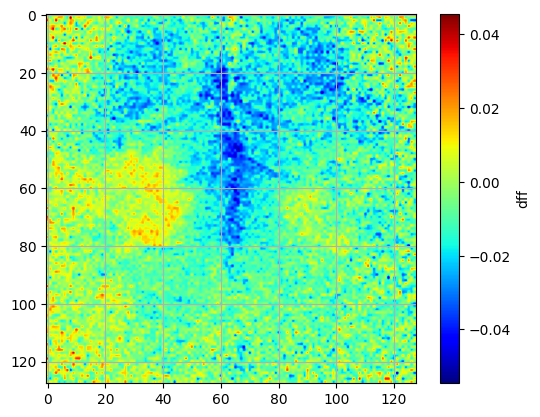

In [23]:
#plot of spatial signal without spatial smoothing
non_smoothed = plot_frame(dff_signal, frame_number, cmap = "jet", color_label = "dff")

#### 6A.2: spatial smoothing applied (gaussian, 3 pixels)

  0%|                                                                                          | 0/128 [00:00<?, ?it/s]

  1%|▋                                                                                 | 1/128 [00:00<00:43,  2.91it/s]

  2%|█▎                                                                                | 2/128 [00:00<00:35,  3.51it/s]

  2%|█▉                                                                                | 3/128 [00:00<00:32,  3.83it/s]

  3%|██▌                                                                               | 4/128 [00:01<00:30,  4.04it/s]

  4%|███▏                                                                              | 5/128 [00:01<00:31,  3.95it/s]

  5%|███▊                                                                              | 6/128 [00:01<00:31,  3.91it/s]

  5%|████▍                                                                             | 7/128 [00:01<00:31,  3.83it/s]

  6%|█████▏                                                                            | 8/128 [00:02<00:32,  3.71it/s]

  7%|█████▊                                                                            | 9/128 [00:02<00:31,  3.80it/s]

  8%|██████▎                                                                          | 10/128 [00:02<00:31,  3.75it/s]

  9%|██████▉                                                                          | 11/128 [00:02<00:30,  3.79it/s]

  9%|███████▌                                                                         | 12/128 [00:03<00:30,  3.78it/s]

 10%|████████▏                                                                        | 13/128 [00:03<00:29,  3.84it/s]

 11%|████████▊                                                                        | 14/128 [00:03<00:29,  3.85it/s]

 12%|█████████▍                                                                       | 15/128 [00:03<00:28,  4.00it/s]

 12%|██████████▏                                                                      | 16/128 [00:04<00:29,  3.86it/s]

 13%|██████████▊                                                                      | 17/128 [00:04<00:28,  3.86it/s]

 14%|███████████▍                                                                     | 18/128 [00:04<00:28,  3.83it/s]

 15%|████████████                                                                     | 19/128 [00:05<00:29,  3.69it/s]

 16%|████████████▋                                                                    | 20/128 [00:05<00:28,  3.80it/s]

 16%|█████████████▎                                                                   | 21/128 [00:05<00:27,  3.89it/s]

 17%|█████████████▉                                                                   | 22/128 [00:05<00:27,  3.87it/s]

 18%|██████████████▌                                                                  | 23/128 [00:06<00:26,  3.90it/s]

 19%|███████████████▏                                                                 | 24/128 [00:06<00:27,  3.81it/s]

 20%|███████████████▊                                                                 | 25/128 [00:06<00:27,  3.80it/s]

 20%|████████████████▍                                                                | 26/128 [00:06<00:27,  3.69it/s]

 21%|█████████████████                                                                | 27/128 [00:07<00:27,  3.72it/s]

 22%|█████████████████▋                                                               | 28/128 [00:07<00:26,  3.82it/s]

 23%|██████████████████▎                                                              | 29/128 [00:07<00:25,  3.91it/s]

 23%|██████████████████▉                                                              | 30/128 [00:07<00:25,  3.86it/s]

 24%|███████████████████▌                                                             | 31/128 [00:08<00:25,  3.87it/s]

 25%|████████████████████▎                                                            | 32/128 [00:08<00:25,  3.77it/s]

 26%|████████████████████▉                                                            | 33/128 [00:08<00:24,  3.88it/s]

 27%|█████████████████████▌                                                           | 34/128 [00:08<00:23,  3.93it/s]

 27%|██████████████████████▏                                                          | 35/128 [00:09<00:24,  3.77it/s]

 28%|██████████████████████▊                                                          | 36/128 [00:09<00:24,  3.83it/s]

 29%|███████████████████████▍                                                         | 37/128 [00:09<00:23,  3.84it/s]

 30%|████████████████████████                                                         | 38/128 [00:09<00:23,  3.83it/s]

 30%|████████████████████████▋                                                        | 39/128 [00:10<00:23,  3.84it/s]

 31%|█████████████████████████▎                                                       | 40/128 [00:10<00:24,  3.63it/s]

 32%|█████████████████████████▉                                                       | 41/128 [00:10<00:24,  3.53it/s]

 33%|██████████████████████████▌                                                      | 42/128 [00:11<00:25,  3.42it/s]

 34%|███████████████████████████▏                                                     | 43/128 [00:11<00:24,  3.42it/s]

 34%|███████████████████████████▊                                                     | 44/128 [00:11<00:24,  3.42it/s]

 35%|████████████████████████████▍                                                    | 45/128 [00:12<00:24,  3.36it/s]

 36%|█████████████████████████████                                                    | 46/128 [00:12<00:24,  3.29it/s]

 37%|█████████████████████████████▋                                                   | 47/128 [00:12<00:25,  3.17it/s]

 38%|██████████████████████████████▍                                                  | 48/128 [00:13<00:26,  3.06it/s]

 38%|███████████████████████████████                                                  | 49/128 [00:13<00:25,  3.12it/s]

 39%|███████████████████████████████▋                                                 | 50/128 [00:13<00:23,  3.25it/s]

 40%|████████████████████████████████▎                                                | 51/128 [00:13<00:23,  3.22it/s]

 41%|████████████████████████████████▉                                                | 52/128 [00:14<00:23,  3.25it/s]

 41%|█████████████████████████████████▌                                               | 53/128 [00:14<00:22,  3.26it/s]

 42%|██████████████████████████████████▏                                              | 54/128 [00:14<00:22,  3.35it/s]

 43%|██████████████████████████████████▊                                              | 55/128 [00:15<00:21,  3.39it/s]

 44%|███████████████████████████████████▍                                             | 56/128 [00:15<00:20,  3.44it/s]

 45%|████████████████████████████████████                                             | 57/128 [00:15<00:20,  3.51it/s]

 45%|████████████████████████████████████▋                                            | 58/128 [00:15<00:20,  3.41it/s]

 46%|█████████████████████████████████████▎                                           | 59/128 [00:16<00:19,  3.57it/s]

 47%|█████████████████████████████████████▉                                           | 60/128 [00:16<00:19,  3.50it/s]

 48%|██████████████████████████████████████▌                                          | 61/128 [00:16<00:18,  3.61it/s]

 48%|███████████████████████████████████████▏                                         | 62/128 [00:17<00:18,  3.62it/s]

 49%|███████████████████████████████████████▊                                         | 63/128 [00:17<00:17,  3.67it/s]

 50%|████████████████████████████████████████▌                                        | 64/128 [00:17<00:18,  3.45it/s]

 51%|█████████████████████████████████████████▏                                       | 65/128 [00:17<00:17,  3.51it/s]

 52%|█████████████████████████████████████████▊                                       | 66/128 [00:18<00:17,  3.59it/s]

 52%|██████████████████████████████████████████▍                                      | 67/128 [00:18<00:16,  3.70it/s]

 53%|███████████████████████████████████████████                                      | 68/128 [00:18<00:15,  3.85it/s]

 54%|███████████████████████████████████████████▋                                     | 69/128 [00:18<00:15,  3.77it/s]

 55%|████████████████████████████████████████████▎                                    | 70/128 [00:19<00:15,  3.77it/s]

 55%|████████████████████████████████████████████▉                                    | 71/128 [00:19<00:14,  3.89it/s]

 56%|█████████████████████████████████████████████▌                                   | 72/128 [00:19<00:14,  3.86it/s]

 57%|██████████████████████████████████████████████▏                                  | 73/128 [00:19<00:13,  3.93it/s]

 58%|██████████████████████████████████████████████▊                                  | 74/128 [00:20<00:14,  3.82it/s]

 59%|███████████████████████████████████████████████▍                                 | 75/128 [00:20<00:13,  3.87it/s]

 59%|████████████████████████████████████████████████                                 | 76/128 [00:20<00:13,  3.96it/s]

 60%|████████████████████████████████████████████████▋                                | 77/128 [00:20<00:12,  4.10it/s]

 61%|█████████████████████████████████████████████████▎                               | 78/128 [00:21<00:11,  4.21it/s]

 62%|█████████████████████████████████████████████████▉                               | 79/128 [00:21<00:12,  4.03it/s]

 62%|██████████████████████████████████████████████████▋                              | 80/128 [00:21<00:12,  3.95it/s]

 63%|███████████████████████████████████████████████████▎                             | 81/128 [00:21<00:11,  4.03it/s]

 64%|███████████████████████████████████████████████████▉                             | 82/128 [00:22<00:11,  3.97it/s]

 65%|████████████████████████████████████████████████████▌                            | 83/128 [00:22<00:11,  3.99it/s]

 66%|█████████████████████████████████████████████████████▏                           | 84/128 [00:22<00:11,  3.92it/s]

 66%|█████████████████████████████████████████████████████▊                           | 85/128 [00:22<00:10,  4.02it/s]

 67%|██████████████████████████████████████████████████████▍                          | 86/128 [00:23<00:10,  4.14it/s]

 68%|███████████████████████████████████████████████████████                          | 87/128 [00:23<00:09,  4.16it/s]

 69%|███████████████████████████████████████████████████████▋                         | 88/128 [00:23<00:10,  3.92it/s]

 70%|████████████████████████████████████████████████████████▎                        | 89/128 [00:23<00:09,  3.97it/s]

 70%|████████████████████████████████████████████████████████▉                        | 90/128 [00:24<00:09,  3.88it/s]

 71%|█████████████████████████████████████████████████████████▌                       | 91/128 [00:24<00:09,  3.80it/s]

 72%|██████████████████████████████████████████████████████████▏                      | 92/128 [00:24<00:09,  3.81it/s]

 73%|██████████████████████████████████████████████████████████▊                      | 93/128 [00:25<00:09,  3.85it/s]

 73%|███████████████████████████████████████████████████████████▍                     | 94/128 [00:25<00:08,  3.84it/s]

 74%|████████████████████████████████████████████████████████████                     | 95/128 [00:25<00:08,  3.94it/s]

 75%|████████████████████████████████████████████████████████████▊                    | 96/128 [00:25<00:08,  3.71it/s]

 76%|█████████████████████████████████████████████████████████████▍                   | 97/128 [00:26<00:08,  3.81it/s]

 77%|██████████████████████████████████████████████████████████████                   | 98/128 [00:26<00:07,  3.83it/s]

 77%|██████████████████████████████████████████████████████████████▋                  | 99/128 [00:26<00:07,  3.81it/s]

 78%|██████████████████████████████████████████████████████████████▌                 | 100/128 [00:26<00:07,  3.82it/s]

 79%|███████████████████████████████████████████████████████████████▏                | 101/128 [00:27<00:07,  3.85it/s]

 80%|███████████████████████████████████████████████████████████████▊                | 102/128 [00:27<00:06,  3.99it/s]

 80%|████████████████████████████████████████████████████████████████▍               | 103/128 [00:27<00:06,  3.72it/s]

 81%|█████████████████████████████████████████████████████████████████               | 104/128 [00:27<00:06,  3.61it/s]

 82%|█████████████████████████████████████████████████████████████████▋              | 105/128 [00:28<00:06,  3.76it/s]

 83%|██████████████████████████████████████████████████████████████████▎             | 106/128 [00:28<00:05,  3.76it/s]

 84%|██████████████████████████████████████████████████████████████████▉             | 107/128 [00:28<00:05,  3.89it/s]

 84%|███████████████████████████████████████████████████████████████████▌            | 108/128 [00:28<00:04,  4.01it/s]

 85%|████████████████████████████████████████████████████████████████████▏           | 109/128 [00:29<00:04,  4.10it/s]

 86%|████████████████████████████████████████████████████████████████████▊           | 110/128 [00:29<00:04,  4.06it/s]

 87%|█████████████████████████████████████████████████████████████████████▍          | 111/128 [00:29<00:04,  4.06it/s]

 88%|██████████████████████████████████████████████████████████████████████          | 112/128 [00:29<00:04,  3.74it/s]

 88%|██████████████████████████████████████████████████████████████████████▋         | 113/128 [00:30<00:04,  3.72it/s]

 89%|███████████████████████████████████████████████████████████████████████▎        | 114/128 [00:30<00:03,  3.72it/s]

 90%|███████████████████████████████████████████████████████████████████████▉        | 115/128 [00:30<00:03,  3.71it/s]

 91%|████████████████████████████████████████████████████████████████████████▌       | 116/128 [00:31<00:03,  3.83it/s]

 91%|█████████████████████████████████████████████████████████████████████████▏      | 117/128 [00:31<00:02,  3.98it/s]

 92%|█████████████████████████████████████████████████████████████████████████▊      | 118/128 [00:31<00:02,  4.07it/s]

 93%|██████████████████████████████████████████████████████████████████████████▍     | 119/128 [00:31<00:02,  4.10it/s]

 94%|███████████████████████████████████████████████████████████████████████████     | 120/128 [00:32<00:02,  3.89it/s]

 95%|███████████████████████████████████████████████████████████████████████████▋    | 121/128 [00:32<00:01,  4.00it/s]

 95%|████████████████████████████████████████████████████████████████████████████▎   | 122/128 [00:32<00:01,  4.01it/s]

 96%|████████████████████████████████████████████████████████████████████████████▉   | 123/128 [00:32<00:01,  4.04it/s]

 97%|█████████████████████████████████████████████████████████████████████████████▌  | 124/128 [00:32<00:00,  4.12it/s]

 98%|██████████████████████████████████████████████████████████████████████████████▏ | 125/128 [00:33<00:00,  4.18it/s]

 98%|██████████████████████████████████████████████████████████████████████████████▊ | 126/128 [00:33<00:00,  4.09it/s]

 99%|███████████████████████████████████████████████████████████████████████████████▍| 127/128 [00:33<00:00,  4.05it/s]

100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:33<00:00,  3.92it/s]

100%|████████████████████████████████████████████████████████████████████████████████| 128/128 [00:33<00:00,  3.77it/s]

frame number 200 plotted


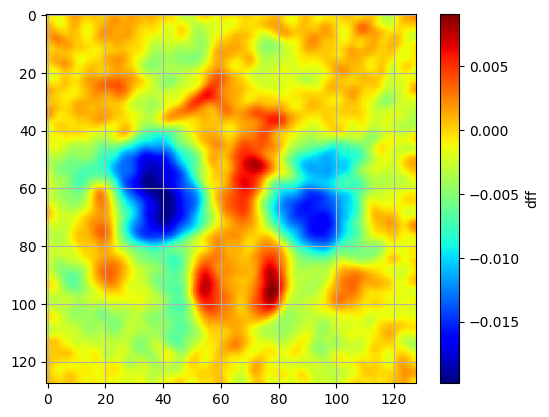

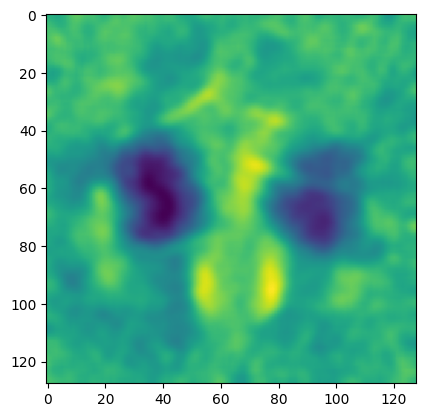

In [24]:
#plot of spatial resolution including spatial smoothing
smoothed_signal = smoothing(dff_signal)
plot_frame(smoothed_signal, 200, cmap = "jet", color_label = "dff")
plt.imshow(smoothed_signal[201])

### 6B: Temporal filtering

dff plot with chebyshev type 1 temporal filtering (high and low bandpass filter)

In [25]:
interactive_plot(smoothed_signal.mean(axis=(1,2)), title_label = "temporally smoothed signal", xaxis_label = "frame number (30 fps)", yaxis_label = "dff")

## Step 7: ROI plotting

### 7A: ROI full frame

plotting single flash full frame mean

In [26]:
full_roi_single, full_single_segments = avg_trials(single_indices, smoothed_signal, double=False, segment_size=200, minus=20)

In [27]:
interactive_plot(full_roi_single.mean(axis=(1,2)), title_label = "full frame single average", xaxis_label = "frame number (30 fps)", yaxis_label = "dff")

plotting double flash full frame mean

In [28]:
full_roi_double, full_double_segments = avg_trials(double_indices, smoothed_signal, double=True, segment_size=200, minus=20)

Segment double length mismatch: expected 200, got 141 at index 29741


In [29]:
interactive_plot(full_roi_double.mean(axis=(1,2)), title_label = "full frame double average", xaxis_label = "frame number (30 fps)", yaxis_label = "dff")

plotting NOGO full frame mean

Need to import the text file to know the location of the nogo trials

In [30]:
txt_path = f"X:/RaymondLab/1_Kai/2_Pi_data/{cohort}/{cageID}/stage2_{cageID}_{mouseID}/lick_rates/{session}_data.txt"
txt_file = load_txt(txt_path, fps=30, footer = 4)

successfully loaded txt file


In [31]:
nogo_trials = extract_nogo(txt_file)

# nogo trials: 24


plotting nogo trials

In [32]:
full_roi_nogo, full_nogo_segments = avg_trials(nogo_trials, smoothed_signal, double=False, segment_size=200, minus=20)

In [33]:
interactive_plot(full_roi_nogo.mean(axis=(1,2)), title_label = "full frame NOGO average", xaxis_label = "frame number (30 fps)", yaxis_label = "dff")

### 7B: V1 ROI

within all of v1 area at the back of the cortex the peak value at 5 frames is taken as the central point and a 15x15 grid is placed around the peak value

plotting single flash just v1 10x10 mean

In [34]:
v1_area_single = extract_v1(full_roi_single, roi_time = 5, roi_start_x=15, roi_start_y = 85, roi_width=45, roi_height = 45)

In [35]:
interactive_plot(v1_area_single.mean(axis=(1,2)), title_label = "v1 single average", xaxis_label = "frame number (30 fps)", yaxis_label = "dff")

plotting double flash just v1 10x10 mean

In [36]:
v1_area_double = extract_v1(full_roi_double, roi_time = 5, roi_start_x=15, roi_start_y = 85, roi_width=45, roi_height = 45)

In [37]:
interactive_plot(v1_area_double.mean(axis=(1,2)), title_label = "v1 double average", xaxis_label = "frame number (30 fps)", yaxis_label = "dff")

## Step 8: Line up to txt file and success vs fail rate

#### Step 8A: load in txt file from Pi_data folder

In [38]:
txt_path = f"X:/RaymondLab/1_Kai/2_Pi_data/{cohort}/{cageID}/stage2_{cageID}_{mouseID}/lick_rates/{session}_data.txt"
txt_file = load_txt(txt_path, fps=30, footer = 4)

#extract single, double or nogo columns from the txt file
single_txt, double_txt, nogo_txt = extract_success(txt_file)

successfully loaded txt file


#### Step 8B: take the dff signal and sort them into arrays based on success or fail

In [39]:
single_success, single_fail = sort_success(single_txt, full_single_segments)

success = 24
fail = 4
total trials = 28


In [40]:
double_success, double_fail = sort_success(double_txt, full_double_segments)

success = 29
fail = 4
total trials = 33


In [41]:
nogo_success, nogo_fail = sort_success(nogo_txt, full_nogo_segments)

success = 8
fail = 16
total trials = 24


## Step 9: Save the 3D array as a TIFF stack

In [42]:
save_tiff(smoothed_signal, tiff_path_full) # full frame whole session tiff stack
save_tiff(full_roi_single, tiff_path_single) #SINGLE flash averaged response over all trials tiff stack file name to save
save_tiff(full_roi_double, tiff_path_double) #DOUBLE flash averaged response over all trials tiff stack file name to save

  0%|                                                                                        | 0/29862 [00:00<?, ?it/s]

  8%|██████▏                                                                   | 2472/29862 [00:00<00:01, 24483.78it/s]

 18%|█████████████                                                             | 5277/29862 [00:00<00:00, 26423.82it/s]

 27%|███████████████████▉                                                      | 8056/29862 [00:00<00:00, 26926.45it/s]

 36%|██████████████████████████▎                                              | 10749/29862 [00:00<00:00, 25914.73it/s]

 45%|████████████████████████████████▋                                        | 13346/29862 [00:00<00:00, 23176.12it/s]

 53%|██████████████████████████████████████▍                                  | 15706/29862 [00:00<00:00, 21889.05it/s]

 62%|████████████████████████████████████████████▉                            | 18397/29862 [00:00<00:00, 23295.13it/s]

 70%|██████████████████████████████████████████████████▊                      | 20763/29862 [00:00<00:00, 22606.12it/s]

 77%|████████████████████████████████████████████████████████▍                | 23071/29862 [00:00<00:00, 22679.84it/s]

 87%|███████████████████████████████████████████████████████████████▏         | 25857/29862 [00:01<00:00, 24122.83it/s]

 95%|█████████████████████████████████████████████████████████████████████▏   | 28295/29862 [00:01<00:00, 24129.95it/s]

100%|█████████████████████████████████████████████████████████████████████████| 29862/29862 [00:01<00:00, 23936.30it/s]

Combined TIFF stack saved successfully.


  0%|                                                                                          | 0/200 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████████████████████████████████████| 200/200 [00:00<00:00, 20006.70it/s]

Combined TIFF stack saved successfully.


  0%|                                                                                          | 0/200 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████████████████████████████████████| 200/200 [00:00<00:00, 25009.27it/s]

Combined TIFF stack saved successfully.


### Step 9B: Pickle for uploading into other scripts

In [43]:
# Now you can use these file paths in your code
with open(pickle_single_v1, 'wb') as f:
    pickle.dump(v1_area_single, f)

with open(pickle_double_v1, 'wb') as f:
    pickle.dump(v1_area_double, f)

with open(pickle_single_success_ff, 'wb') as f:
    pickle.dump(single_success, f)

with open(pickle_single_fail_ff, 'wb') as f:
    pickle.dump(single_fail, f)

with open(pickle_double_success_ff, 'wb') as f:
    pickle.dump(double_success, f)

with open(pickle_double_fail_ff, 'wb') as f:
    pickle.dump(double_fail, f)

with open(pickle_nogo_success_ff, 'wb') as f:
    pickle.dump(nogo_success, f)

with open(pickle_nogo_fail_ff, 'wb') as f:
    pickle.dump(nogo_fail, f)

# Mask and animate figures

#### currently not using these, good for visualization and flair

In [44]:
#masking = load_masks(dff_signal)
#mask, mask_outline = masking[0], masking[1]

#masked_smoothed_signal = smoothed_signal*mask
#masked_full_roi_single = full_roi_single*mask
#masked_full_roi_double = full_roi_double*mask

In [45]:
#file_path_ = "X:/Raymond Lab/Kaiiiii/processed_data/ #429904_m1_stage2_day2_with_spouts.tiff"
#save_tiff(masked_smoothed_signal, file_path)

#file_path = "X:/Raymond Lab/Kaiiiii/processed_data/ #429904_m1_stage2_day2_with_spouts_avg_single.tiff"
#save_tiff(masked_full_roi_single, file_path)

#file_path = "X:/Raymond Lab/Kaiiiii/processed_data/ #429904_m1_stage2_day2_with_spouts_avg_double.tiff"
#save_tiff(masked_full_roi_double, file_path)

#print(f"TIFF stack saved at: {file_path}")